Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Imports

In [2]:
from matplotlib import pyplot as plt
import tensorflow as tf

import tensorflow.keras as keras
import tensorflow.keras.layers as layers
from keras.optimizers import Adam

from tensorflow.keras.datasets import mnist 
from tensorflow.keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from tensorflow.keras import losses

import numpy as np
import os

from keras.utils.vis_utils import plot_model
from keras.models import load_model
from numpy.random import randn

from numpy import asarray
from numpy.random import randn, randint
from keras.optimizers import Adam
from keras.models import Model
from keras.layers import Input,Dense,Reshape,Flatten,Conv2D,LeakyReLU,Dropout,Embedding,Concatenate
from keras.datasets.mnist import load_data
from numpy import asarray
from numpy import linspace
from keras.models import load_model


# Utils

Parameters

In [3]:
latent_dim = 64
noise_sigma = 0.35
train_AE = True
sml_train_size = 50
checkpoint_path = "/content/drive/MyDrive/Deep Learning /model_save/cp.ckpt"

In [4]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

11493376/11490434 [==============================] - 0s 0us/step


In [5]:
def load_data(x_train, y_train,x_test, y_test):
  # load train and test images, and pad & reshape them to (-1,32,32,1)
  x_train = np.reshape(x_train, (len(x_train), 28, 28, 1)).astype('float32') / 255.0
  x_test = np.reshape(x_test, (len(x_test), 28, 28, 1)).astype('float32') / 255.0
  x_train = np.pad(x_train, ((0,0),(2, 2), (2, 2),(0,0)))
  x_test = np.pad(x_test, ((0,0),(2, 2), (2, 2),(0,0)))
  print(x_train.shape)
  print(x_test.shape)
  y_train = keras.utils.to_categorical(y_train, num_classes=10, dtype='float32')
  y_test = keras.utils.to_categorical(y_test, num_classes=10, dtype='float32')
  return (x_train, y_train), (x_test, y_test)

In [16]:
def plot(x_test,decoded_imgs):
  n = 10
  plt.figure(figsize=(20, 4))
  for i in range(1, n + 1):
      # Display original
      ax = plt.subplot(2, n, i)
      plt.imshow(x_test[i].reshape(32, 32))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # Display reconstruction
      ax = plt.subplot(2, n, i + n)
      plt.imshow(decoded_imgs[i].reshape(32, 32))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
  plt.show()

In [6]:
def build_AE(latent_dim):
  encoder = Sequential()
  encoder.add(layers.Conv2D(16, (4, 4), strides=(2,2), activation='relu', padding='same', input_shape=(32,32,1)))
  encoder.add(layers.Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
  encoder.add(layers.Conv2D(64, (3, 3), strides=(2,2), activation='relu', padding='same'))
  encoder.add(layers.Conv2D(96, (3, 3), strides=(2,2), activation='relu', padding='same'))
  encoder.add(layers.Reshape((2*2*96,)))
  encoder.add(layers.Dense(latent_dim))

  # at this point the representation is (4, 4, 8) i.e. 128-dimensional
  decoder = Sequential()
  decoder.add(layers.Dense(2*2*96,activation='relu', input_shape=(latent_dim,)))
  decoder.add(layers.Reshape((2,2,96)))
  decoder.add(layers.Conv2DTranspose(64, (3, 3), strides=(2,2), activation='relu', padding='same'))
  decoder.add(layers.Conv2DTranspose(32, (3, 3), strides=(2,2), activation='relu', padding='same'))
  decoder.add(layers.Conv2DTranspose(16, (4, 4), strides=(2,2), activation='relu', padding='same'))
  decoder.add(layers.Conv2DTranspose(1, (4, 4), strides=(2,2), activation='sigmoid', padding='same'))
  autoencoder = keras.Model(encoder.inputs, decoder(encoder.outputs))
  return autoencoder, encoder , decoder

In [ ]:
def train_AE(autoencoder,x_train,x_test,checkpoint_path):
  checkpoint_dir = os.path.dirname(checkpoint_path)
  cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=True)
  autoencoder.fit(x_train + noise_sigma * np.random.randn(*x_train.shape),
                  x_train,
                  epochs=15,
                  batch_size=128,
                  shuffle=True,
                  validation_data=(x_test, x_test),callbacks=[cp_callback])
  return autoencoder

In [11]:
(x_train, y_train_cat), (x_test, y_test_cat) = load_data(x_train, y_train,x_test, y_test)

(60000, 32, 32, 1)
(10000, 32, 32, 1)


In [ ]:
autoencoder, encoder , decoder = build_AE(latent_dim)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

if train_AE:
  autoencoder = train_AE(autoencoder,x_train,x_test,checkpoint_path)
else:
	autoencoder.load_weights(checkpoint_path)

Epoch 1/15
469/469 [==============================] - 41s 85ms/step - loss: 0.2952 - val_loss: 0.1073
Epoch 2/15
469/469 [==============================] - 46s 98ms/step - loss: 0.1019 - val_loss: 0.0823
Epoch 3/15
469/469 [==============================] - 40s 85ms/step - loss: 0.0838 - val_loss: 0.0728
Epoch 4/15
469/469 [==============================] - 40s 85ms/step - loss: 0.0778 - val_loss: 0.0701
Epoch 5/15
469/469 [==============================] - 40s 86ms/step - loss: 0.0743 - val_loss: 0.0665
Epoch 6/15
469/469 [==============================] - 40s 86ms/step - loss: 0.0720 - val_loss: 0.0648
Epoch 7/15
469/469 [==============================] - 41s 87ms/step - loss: 0.0706 - val_loss: 0.0637
Epoch 8/15
469/469 [==============================] - 41s 87ms/step - loss: 0.0695 - val_loss: 0.0628
Epoch 9/15
469/469 [==============================] - 41s 87ms/step - loss: 0.0685 - val_loss: 0.0619
Epoch 10/15
469/469 [==============================] - 42s 89ms/step - loss: 0.067

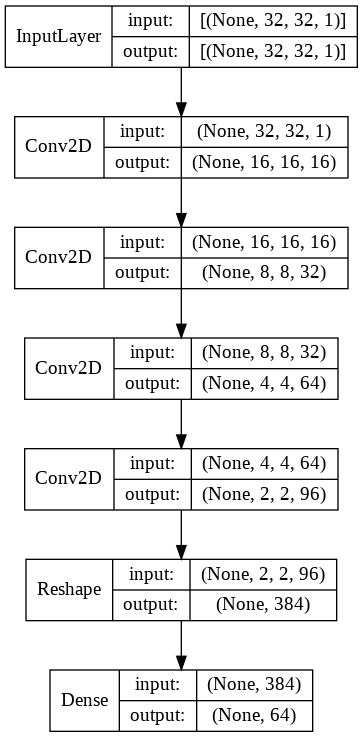

In [ ]:
plot_model(encoder, show_shapes=True,show_layer_names=False)

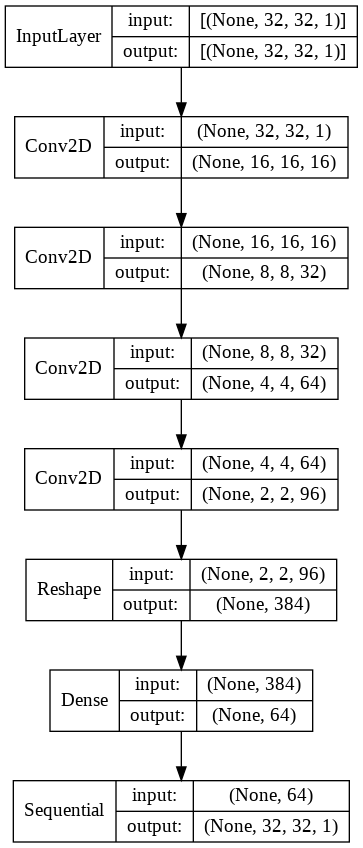

In [ ]:
plot_model(autoencoder, show_shapes=True,show_layer_names=False)

In [ ]:
latent_codes = encoder.predict(x_test)
decoded_imgs = decoder.predict(latent_codes)

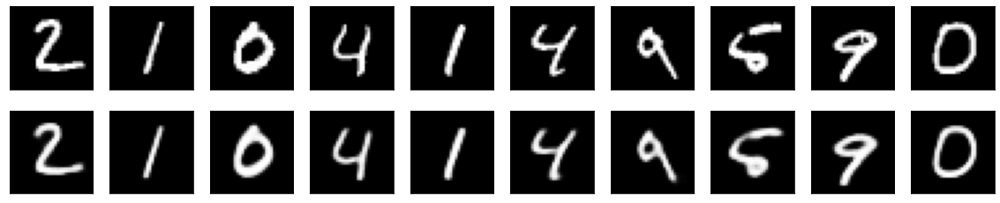

In [ ]:
plot(x_test,decoded_imgs)

In [7]:
autoencoder, encoder , decoder = build_AE(latent_dim)
autoencoder.load_weights(checkpoint_path)

Show the encoded image with lower dimention

In [12]:
img_with_noise = x_train + noise_sigma * np.random.randn(*x_train.shape)
encoded_img = encoder.predict(img_with_noise)

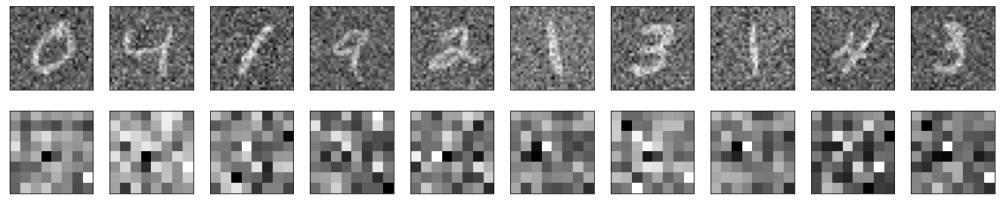

In [19]:
  n = 10
  plt.figure(figsize=(20, 4))
  for i in range(1, n + 1):
      # Display original
      ax = plt.subplot(2, n, i)
      plt.imshow(img_with_noise[i].reshape(32, 32))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)

      # Display reconstruction
      ax = plt.subplot(2, n, i + n)
      plt.imshow(encoded_img[i].reshape(8, 8))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
  plt.show()

# Transfer Learning 

## Small MLP - minimal classifier

### Encoder fixed weights

Once the encoder is trained, you can fix its weights and set up a small MLP over its latent space to perform classification (digits values). We’d like to train this much smaller network with much less labeled examples, namely 50(!) Try to achieve the best classification test score by adjusting the architecture of this small MLP. 


After the autoencoder was trained, we could load it.

In [ ]:
autoencoder, encoder , decoder = build_AE(latent_dim)
autoencoder.load_weights(checkpoint_path)

Now we wont train the encoder, instead we can use the latent space it creates as an input to the classifier. We map only 50 example from the training set to the latent space.

In [ ]:
train_codes = encoder.predict(x_train[:sml_train_size])
test_codes = encoder.predict(x_test)

Define the minimal classifier and train it

In [ ]:
# Classifier Network - currently minimal
classifier = Sequential()
classifier.add(layers.Dense(10,activation='softmax', input_shape=(latent_dim,)))
classifier.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

classifier.fit(train_codes, y_train[:sml_train_size],
	                epochs=200,
	                batch_size=16,
	                shuffle=True,
	                validation_data=(test_codes, y_test))


Epoch 1/200
4/4 [==============================] - 1s 221ms/step - loss: 6.2332 - accuracy: 0.0817 - val_loss: 5.9923 - val_accuracy: 0.1125
Epoch 2/200
4/4 [==============================] - 0s 161ms/step - loss: 6.2757 - accuracy: 0.1167 - val_loss: 5.7653 - val_accuracy: 0.1170
Epoch 3/200
4/4 [==============================] - 0s 165ms/step - loss: 5.9324 - accuracy: 0.1001 - val_loss: 5.5631 - val_accuracy: 0.1229
Epoch 4/200
4/4 [==============================] - 1s 177ms/step - loss: 5.4414 - accuracy: 0.0855 - val_loss: 5.3725 - val_accuracy: 0.1291
Epoch 5/200
4/4 [==============================] - 1s 247ms/step - loss: 5.2985 - accuracy: 0.1063 - val_loss: 5.1847 - val_accuracy: 0.1347
Epoch 6/200
4/4 [==============================] - 1s 167ms/step - loss: 4.8089 - accuracy: 0.1230 - val_loss: 4.9980 - val_accuracy: 0.1404
Epoch 7/200
4/4 [==============================] - 1s 166ms/step - loss: 4.9624 - accuracy: 0.1355 - val_loss: 4.8107 - val_accuracy: 0.1464
Epoch 8/200
4

In [ ]:
train_pred = classifier.predict(train_codes)
test_pred = classifier.predict(test_codes)

((50,), (10000,), (50,), (10000,))

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_train[:sml_train_size].argmax(1), train_pred.argmax(1)))
print(classification_report(y_test.argmax(1), test_pred.argmax(1)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         4
           8       1.00      1.00      1.00         4
           9       1.00      1.00      1.00         7

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50

              precision    recall  f1-score   support

           0       0.75      0.86      0.80       980
           1       0.85      0.98      0.91      1135
           2       0.67      0.64      0.66      1032
           3       0.69 

### Composition of encoder and smaller MLP 

For comparison, set up a classification network that is equivalent to the composition of the encoder and your smaller MLP and train it using the same number labeled training examples and see what test accuracy it achieves (wait till its convergence). Describe the test accuracy these tests produced, as well as the architecture of the MLP you ended up using.

In [ ]:
full_cls_enc = keras.models.clone_model(encoder)
full_cls_cls = keras.models.clone_model(classifier)
full_cls = keras.Model(full_cls_enc.inputs,full_cls_cls(full_cls_enc.outputs))

full_cls.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

history = full_cls.fit(x_train[:sml_train_size], y_train[:sml_train_size],
	                epochs=100,
	                batch_size=16,
	                shuffle=True,
	                validation_data=(x_test, y_test))

Epoch 1/100
4/4 [==============================] - 3s 896ms/step - loss: 2.3021 - accuracy: 0.0737 - val_loss: 2.2795 - val_accuracy: 0.3076
Epoch 2/100
4/4 [==============================] - 2s 740ms/step - loss: 2.2625 - accuracy: 0.5136 - val_loss: 2.2576 - val_accuracy: 0.2893
Epoch 3/100
4/4 [==============================] - 2s 786ms/step - loss: 2.2065 - accuracy: 0.4329 - val_loss: 2.2135 - val_accuracy: 0.2294
Epoch 4/100
4/4 [==============================] - 2s 814ms/step - loss: 2.1075 - accuracy: 0.2846 - val_loss: 2.1664 - val_accuracy: 0.2256
Epoch 5/100
4/4 [==============================] - 2s 800ms/step - loss: 1.9623 - accuracy: 0.2867 - val_loss: 2.0880 - val_accuracy: 0.2766
Epoch 6/100
4/4 [==============================] - 2s 733ms/step - loss: 1.8036 - accuracy: 0.5118 - val_loss: 1.8654 - val_accuracy: 0.4087
Epoch 7/100
4/4 [==============================] - 2s 763ms/step - loss: 1.4746 - accuracy: 0.5573 - val_loss: 1.6340 - val_accuracy: 0.4811
Epoch 8/100
4

In [ ]:
train_pred_full_cls = full_cls.predict(x_train[:sml_train_size])
test_pred_full_cls = full_cls.predict(x_test)
print(classification_report(y_train[:sml_train_size].argmax(1), train_pred_full_cls.argmax(1)))
print(classification_report(y_test.argmax(1), test_pred_full_cls.argmax(1)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         4
           8       1.00      1.00      1.00         4
           9       1.00      1.00      1.00         7

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50

              precision    recall  f1-score   support

           0       0.86      0.68      0.76       980
           1       0.80      0.96      0.87      1135
           2       0.55      0.63      0.59      1032
           3       0.72 

Plot Results - loss and accuracy

In [ ]:
def plot_graphs(history, metric):
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])

(0.0, 2.416394855298859)

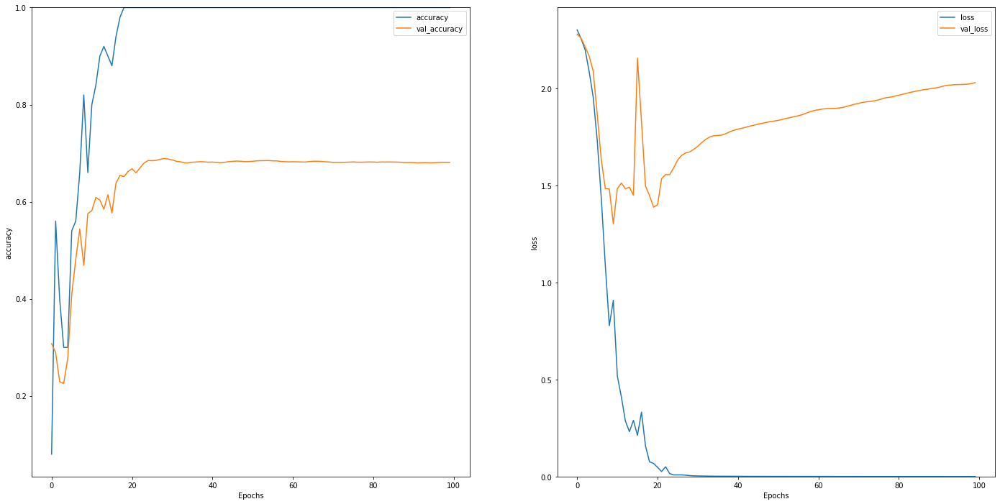

In [ ]:
plt.figure(figsize=(24,12))
plt.subplot(1,2,1)
plot_graphs(history, 'accuracy')
plt.ylim(None,1)
plt.subplot(1,2,2)
plot_graphs(history, 'loss')
plt.ylim(0,None)

## Small MLP 

### Encoder fixed weights

A dropout layer randomly drops some of the connections between layers. This helps to prevent overfitting.

In [ ]:
# Classifer Network - currently minimal
new_classifier = Sequential()
new_classifier.add(layers.Dense(128, input_shape=(latent_dim,)))
new_classifier.add(keras.layers.Dropout(0.4))
new_classifier.add(layers.Dense(16))
new_classifier.add(keras.layers.Dropout(0.4))
new_classifier.add(layers.Dense(10,activation='softmax'))

new_classifier.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

es_callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

hist = new_classifier.fit(train_codes, y_train[:sml_train_size],
	                epochs=200,
	                batch_size=16,
	                shuffle=True,
	                validation_data=(test_codes, y_test),
                  callbacks=[es_callback])


Epoch 1/200
4/4 [==============================] - 1s 227ms/step - loss: 9.0189 - accuracy: 0.1536 - val_loss: 4.0338 - val_accuracy: 0.1146
Epoch 2/200
4/4 [==============================] - 1s 179ms/step - loss: 6.9523 - accuracy: 0.1042 - val_loss: 3.1356 - val_accuracy: 0.1840
Epoch 3/200
4/4 [==============================] - 1s 168ms/step - loss: 4.8969 - accuracy: 0.1536 - val_loss: 2.6377 - val_accuracy: 0.2748
Epoch 4/200
4/4 [==============================] - 1s 174ms/step - loss: 5.0220 - accuracy: 0.2113 - val_loss: 2.4101 - val_accuracy: 0.3367
Epoch 5/200
4/4 [==============================] - 1s 171ms/step - loss: 3.4071 - accuracy: 0.3467 - val_loss: 2.2262 - val_accuracy: 0.3876
Epoch 6/200
4/4 [==============================] - 1s 171ms/step - loss: 3.3905 - accuracy: 0.3155 - val_loss: 2.0651 - val_accuracy: 0.4280
Epoch 7/200
4/4 [==============================] - 1s 170ms/step - loss: 3.8090 - accuracy: 0.1904 - val_loss: 1.9446 - val_accuracy: 0.4559
Epoch 8/200
4

(0.0, 9.08854774683714)

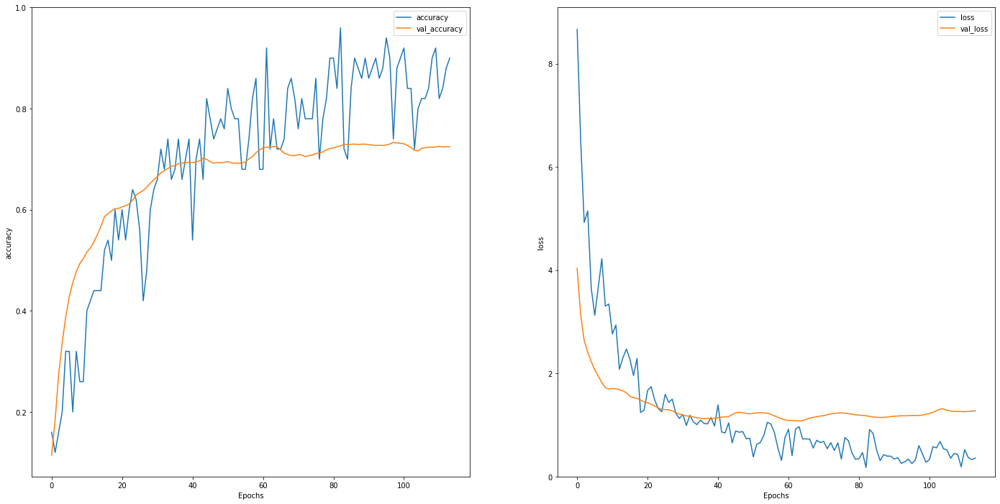

In [ ]:
plt.figure(figsize=(24,12))
plt.subplot(1,2,1)
plot_graphs(hist, 'accuracy')
plt.ylim(None,1)
plt.subplot(1,2,2)
plot_graphs(hist, 'loss')
plt.ylim(0,None)

In [ ]:
new_classifier_train_pred = new_classifier.predict(train_codes)
new_classifier_test_pred = new_classifier.predict(test_codes)

In [ ]:
print(classification_report(y_train[:sml_train_size].argmax(1), new_classifier_train_pred.argmax(1)))
print(classification_report(y_test.argmax(1), new_classifier_test_pred.argmax(1)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         4
           8       1.00      1.00      1.00         4
           9       1.00      1.00      1.00         7

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50

              precision    recall  f1-score   support

           0       0.83      0.78      0.81       980
           1       0.75      0.99      0.85      1135
           2       0.68      0.66      0.67      1032
           3       0.67 

### Composition of encoder and smaller MLP 

In [ ]:
full_cls_enc = keras.models.clone_model(encoder)
full_cls_cls = keras.models.clone_model(new_classifier)
full_cls = keras.Model(full_cls_enc.inputs,full_cls_cls(full_cls_enc.outputs))

full_cls.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

es_callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)

history = full_cls.fit(x_train[:sml_train_size], y_train[:sml_train_size],
	                epochs=100,
	                batch_size=16,
	                shuffle=True,
	                validation_data=(x_test, y_test),
                  callbacks=[es_callback])

Epoch 1/100
4/4 [==============================] - 3s 624ms/step - loss: 2.3042 - accuracy: 0.1296 - val_loss: 2.2828 - val_accuracy: 0.2197
Epoch 2/100
4/4 [==============================] - 2s 601ms/step - loss: 2.2424 - accuracy: 0.2272 - val_loss: 2.2648 - val_accuracy: 0.2400
Epoch 3/100
4/4 [==============================] - 2s 562ms/step - loss: 2.2344 - accuracy: 0.2412 - val_loss: 2.2289 - val_accuracy: 0.3353
Epoch 4/100
4/4 [==============================] - 2s 522ms/step - loss: 2.2395 - accuracy: 0.2183 - val_loss: 2.1797 - val_accuracy: 0.3411
Epoch 5/100
4/4 [==============================] - 2s 526ms/step - loss: 2.0506 - accuracy: 0.4267 - val_loss: 2.1006 - val_accuracy: 0.2407
Epoch 6/100
4/4 [==============================] - 2s 517ms/step - loss: 1.9668 - accuracy: 0.3440 - val_loss: 1.9766 - val_accuracy: 0.3712
Epoch 7/100
4/4 [==============================] - 2s 560ms/step - loss: 1.6537 - accuracy: 0.4569 - val_loss: 1.9095 - val_accuracy: 0.3799
Epoch 8/100
4

In [ ]:
train_pred_full_cls = full_cls.predict(x_train[:sml_train_size])
test_pred_full_cls = full_cls.predict(x_test)
print(classification_report(y_train[:sml_train_size].argmax(1), train_pred_full_cls.argmax(1)))
print(classification_report(y_test.argmax(1), test_pred_full_cls.argmax(1)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         7
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         4
           8       1.00      1.00      1.00         4
           9       1.00      1.00      1.00         7

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50

              precision    recall  f1-score   support

           0       0.77      0.67      0.72       980
           1       0.73      0.98      0.83      1135
           2       0.69      0.46      0.55      1032
           3       0.74 

(0.0, 2.4138781815767287)

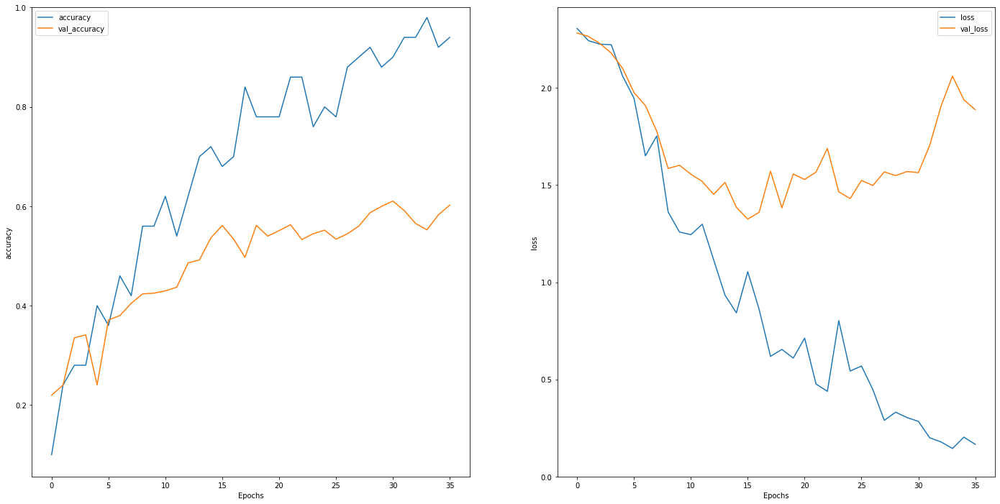

In [ ]:
plt.figure(figsize=(24,12))
plt.subplot(1,2,1)
plot_graphs(history, 'accuracy')
plt.ylim(None,1)
plt.subplot(1,2,2)
plot_graphs(history, 'loss')
plt.ylim(0,None)

Describe the test accuracy these tests produced, as well as the architecture of the MLP you ended up using.


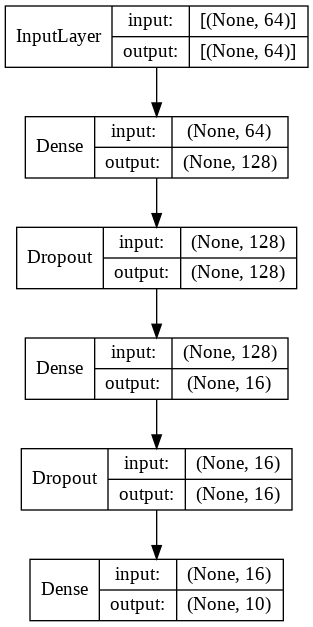

In [ ]:
plot_model(new_classifier, show_shapes=True,show_layer_names=False)

#Generative Adversarial Networks 

Implement a GAN in latent space, i.e., define an MLP generator network that maps some easy-to-sample distribution into the latet codes of the MNIST dataset, as produced by the (pre-trained) encoder. Once trained, this generator can be combined with the (pre-trained) decoder to generate novel images. The GAN’s latent space can be of a lower space dimension from the AE’s.

In [10]:
autoencoder, encoder , decoder = build_AE(latent_dim)
autoencoder.load_weights(checkpoint_path)

In [11]:
# The decoder weights are not updated
decoder.trainable = False
decoder.compile(optimizer='adam', loss='binary_crossentropy')

In [12]:
def define_discriminator(in_shape=(32,32,1)):
  """The discriminator takes as input a 32x32 grayscale image and outputs a
  binary prediction as to whether the image is real (class=1) or fake (class=0). """
  model = Sequential()
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=in_shape))
  model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
  model.add(Flatten())
  model.add(Dense(1, activation='sigmoid'))
  opt = Adam(lr=0.0001, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [29]:
def define_generator(latent_dim,decoder):
  """The generator model takes as input points in the latent space and outputs a
   single 32x32 grayscale image."""
  model = Sequential()
  n_nodes = 4 * 4 * 8
  model.add(Dense(n_nodes, input_dim=latent_dim))
  model.add(layers.Dense(64))
  model.add(decoder)
  return model

In [14]:
def define_gan(g_model, d_model):
  """ GAN combines both the generator and the discriminator into one larger model,
  to train the model weights in the generator. It is done using the output and
  error calculated by the discriminator.
  The discriminator weights are marked as not trainable to ensure that only the
  weights of the generator are updated."""
  d_model.trainable = False
  model = Sequential()
  model.add(g_model)
  model.add(d_model)
  opt = Adam(lr=0.0001, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

In [15]:
def generate_real_samples(dataset, n_samples):
  """This function selects and returns a random sample of images and their 
  corresponding class label for the discriminator."""
  ix = randint(0, dataset.shape[0], n_samples)
  X = dataset[ix]
  # class=1, indicating that the images are real.
  y = np.ones((n_samples, 1))
  return X, y
 
def generate_latent_points(latent_dim, n_samples):
  """ This function gets as input the size of the latent space and the number of
  points required. It returns a batch of input samples for the generator model."""
  x_input = randn(latent_dim * n_samples)
  x_input = x_input.reshape(n_samples, latent_dim)
  return x_input
 
def generate_fake_samples(g_model, latent_dim, n_samples):
  """This function gets as input a generator latent space dimention.
  It generates points in the latent space and uses them as input to the generator.
  The function returns the generated images and their corresponding class label
  for the discriminator model.
  """
  x_input = generate_latent_points(latent_dim, n_samples)
  X = g_model.predict(x_input)
  #  class=0 to indicate the images are fake
  y = np.zeros((n_samples, 1))
  return X, y

In [40]:
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=50, n_batch=128):
  bat_per_epo = int(dataset.shape[0] / n_batch)
  half_batch = int(n_batch / 2)
  for i in range(n_epochs):
    for j in range(bat_per_epo):
      X_real, y_real = generate_real_samples(dataset, half_batch)
      X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
      # print(X_real.shape, X_fake.shape,y_real.shape,y_fake.shape)
      X, y = np.vstack((X_real, X_fake)), np.vstack((y_real, y_fake))
      # update discriminator weights
      d_loss, _ = d_model.train_on_batch(X, y)
      # generate latent space points as input for the generator
      X_gan = generate_latent_points(latent_dim, n_batch)
      # inverted labels for the fake samples
      y_gan = np.ones((n_batch, 1))
      g_loss = gan_model.train_on_batch(X_gan, y_gan)
      print('>%d, %d/%d, d=%.3f, g=%.3f' % (i+1, j+1, bat_per_epo, d_loss, g_loss))
      # evaluate
    if (i+1) % 20 == 0:
      summarize_performance(i, g_model, d_model, dataset, latent_dim)
  return g_model

In [38]:
def save_plot(examples, epoch, n=10):
  for i in range(n * n):
    plt.subplot(n, n, 1 + i)
    plt.axis('off')
    plt.imshow(examples[i, :, :, 0], cmap='gray_r')
  plt.show()
  # save plot
  filename = 'generated_plot_e%03d.png' % (epoch+1)
  plt.savefig(filename)
  
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
  # evaluate discriminator on real and fake examples
  X_real, y_real = generate_real_samples(dataset, n_samples)
  _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
  x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
  _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
  print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
  # show and save plot
  X = (x_fake + 1) / 2.0
  save_plot(X, epoch)

In [ ]:
def generate_img(model,latent_dim):
  # We randomly generated 15 images from 15 series of noise information
  n = 3
  m = 5
  digit_size1 = 32
  digit_size2 = 32
  figure = np.zeros((digit_size1 * n, digit_size2 * m,1))
  
  for i in range(3):
      for j in range(5):
          z_sample = np.random.rand(1,latent_dim)
          x_decoded = model.predict([z_sample])
          figure[i * digit_size1: (i + 1) * digit_size1,
                j * digit_size2: (j + 1) * digit_size2,:] = (x_decoded[0]+1)/2 
  plt.figure(figsize=(10, 10))
  plt.imshow(figure[:,:,0],cmap = 'gray')
  plt.show()

## Train model 100 epochs

Streaming output truncated to the last 5000 lines.
>10, 150/468, d=0.685, g=0.712
>10, 151/468, d=0.686, g=0.735
>10, 152/468, d=0.679, g=0.719
>10, 153/468, d=0.681, g=0.725
>10, 154/468, d=0.674, g=0.731
>10, 155/468, d=0.697, g=0.735
>10, 156/468, d=0.670, g=0.731
>10, 157/468, d=0.672, g=0.711
>10, 158/468, d=0.685, g=0.767
>10, 159/468, d=0.676, g=0.714
>10, 160/468, d=0.729, g=0.696
>10, 161/468, d=0.659, g=0.744
>10, 162/468, d=0.678, g=0.714
>10, 163/468, d=0.663, g=0.738
>10, 164/468, d=0.666, g=0.706
>10, 165/468, d=0.671, g=0.742
>10, 166/468, d=0.677, g=0.749
>10, 167/468, d=0.670, g=0.723
>10, 168/468, d=0.687, g=0.710
>10, 169/468, d=0.686, g=0.706
>10, 170/468, d=0.692, g=0.749
>10, 171/468, d=0.685, g=0.736
>10, 172/468, d=0.683, g=0.697
>10, 173/468, d=0.689, g=0.687
>10, 174/468, d=0.680, g=0.726
>10, 175/468, d=0.682, g=0.713
>10, 176/468, d=0.684, g=0.705
>10, 177/468, d=0.672, g=0.746
>10, 178/468, d=0.679, g=0.735
>10, 179/468, d=0.682, g=0.732
>10, 180/468, d=0.6

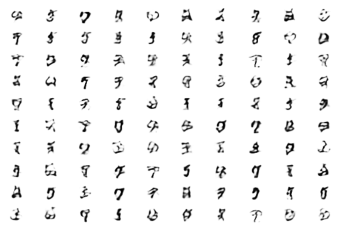

Streaming output truncated to the last 5000 lines.
>30, 150/468, d=0.693, g=0.715
>30, 151/468, d=0.679, g=0.728
>30, 152/468, d=0.686, g=0.718
>30, 153/468, d=0.687, g=0.704
>30, 154/468, d=0.680, g=0.703
>30, 155/468, d=0.688, g=0.700
>30, 156/468, d=0.694, g=0.691
>30, 157/468, d=0.674, g=0.713
>30, 158/468, d=0.702, g=0.716
>30, 159/468, d=0.675, g=0.697
>30, 160/468, d=0.680, g=0.697
>30, 161/468, d=0.678, g=0.714
>30, 162/468, d=0.682, g=0.700
>30, 163/468, d=0.686, g=0.718
>30, 164/468, d=0.687, g=0.706
>30, 165/468, d=0.685, g=0.719
>30, 166/468, d=0.698, g=0.712
>30, 167/468, d=0.692, g=0.693
>30, 168/468, d=0.687, g=0.724
>30, 169/468, d=0.692, g=0.730
>30, 170/468, d=0.695, g=0.697
>30, 171/468, d=0.683, g=0.703
>30, 172/468, d=0.687, g=0.699
>30, 173/468, d=0.683, g=0.709
>30, 174/468, d=0.680, g=0.701
>30, 175/468, d=0.691, g=0.700
>30, 176/468, d=0.674, g=0.715
>30, 177/468, d=0.700, g=0.729
>30, 178/468, d=0.680, g=0.694
>30, 179/468, d=0.695, g=0.717
>30, 180/468, d=0.6

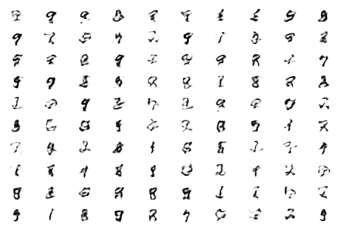

Streaming output truncated to the last 5000 lines.
>50, 150/468, d=0.685, g=0.700
>50, 151/468, d=0.693, g=0.730
>50, 152/468, d=0.676, g=0.698
>50, 153/468, d=0.698, g=0.682
>50, 154/468, d=0.680, g=0.705
>50, 155/468, d=0.667, g=0.752
>50, 156/468, d=0.673, g=0.703
>50, 157/468, d=0.685, g=0.715
>50, 158/468, d=0.690, g=0.719
>50, 159/468, d=0.689, g=0.732
>50, 160/468, d=0.671, g=0.726
>50, 161/468, d=0.694, g=0.685
>50, 162/468, d=0.705, g=0.705
>50, 163/468, d=0.675, g=0.757
>50, 164/468, d=0.688, g=0.750
>50, 165/468, d=0.685, g=0.720
>50, 166/468, d=0.686, g=0.713
>50, 167/468, d=0.710, g=0.687
>50, 168/468, d=0.687, g=0.710
>50, 169/468, d=0.701, g=0.731
>50, 170/468, d=0.699, g=0.682
>50, 171/468, d=0.670, g=0.729
>50, 172/468, d=0.693, g=0.700
>50, 173/468, d=0.691, g=0.687
>50, 174/468, d=0.683, g=0.717
>50, 175/468, d=0.666, g=0.758
>50, 176/468, d=0.687, g=0.737
>50, 177/468, d=0.681, g=0.670
>50, 178/468, d=0.685, g=0.702
>50, 179/468, d=0.685, g=0.715
>50, 180/468, d=0.6

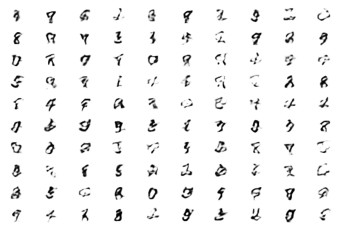

Streaming output truncated to the last 5000 lines.
>70, 150/468, d=0.696, g=0.699
>70, 151/468, d=0.689, g=0.695
>70, 152/468, d=0.692, g=0.738
>70, 153/468, d=0.674, g=0.717
>70, 154/468, d=0.688, g=0.715
>70, 155/468, d=0.667, g=0.710
>70, 156/468, d=0.698, g=0.733
>70, 157/468, d=0.681, g=0.704
>70, 158/468, d=0.680, g=0.730
>70, 159/468, d=0.679, g=0.695
>70, 160/468, d=0.682, g=0.716
>70, 161/468, d=0.687, g=0.720
>70, 162/468, d=0.673, g=0.738
>70, 163/468, d=0.686, g=0.699
>70, 164/468, d=0.676, g=0.721
>70, 165/468, d=0.660, g=0.763
>70, 166/468, d=0.685, g=0.725
>70, 167/468, d=0.689, g=0.687
>70, 168/468, d=0.670, g=0.721
>70, 169/468, d=0.688, g=0.741
>70, 170/468, d=0.689, g=0.702
>70, 171/468, d=0.699, g=0.666
>70, 172/468, d=0.686, g=0.685
>70, 173/468, d=0.680, g=0.726
>70, 174/468, d=0.689, g=0.739
>70, 175/468, d=0.686, g=0.710
>70, 176/468, d=0.695, g=0.686
>70, 177/468, d=0.692, g=0.723
>70, 178/468, d=0.674, g=0.743
>70, 179/468, d=0.686, g=0.698
>70, 180/468, d=0.6

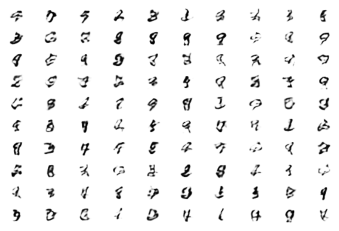

Streaming output truncated to the last 5000 lines.
>90, 150/468, d=0.691, g=0.708
>90, 151/468, d=0.694, g=0.694
>90, 152/468, d=0.697, g=0.705
>90, 153/468, d=0.690, g=0.713
>90, 154/468, d=0.687, g=0.705
>90, 155/468, d=0.680, g=0.688
>90, 156/468, d=0.691, g=0.731
>90, 157/468, d=0.689, g=0.730
>90, 158/468, d=0.707, g=0.691
>90, 159/468, d=0.707, g=0.670
>90, 160/468, d=0.693, g=0.702
>90, 161/468, d=0.689, g=0.721
>90, 162/468, d=0.689, g=0.723
>90, 163/468, d=0.687, g=0.731
>90, 164/468, d=0.685, g=0.719
>90, 165/468, d=0.691, g=0.685
>90, 166/468, d=0.681, g=0.674
>90, 167/468, d=0.696, g=0.722
>90, 168/468, d=0.661, g=0.764
>90, 169/468, d=0.691, g=0.733
>90, 170/468, d=0.701, g=0.679
>90, 171/468, d=0.675, g=0.697
>90, 172/468, d=0.685, g=0.732
>90, 173/468, d=0.694, g=0.725
>90, 174/468, d=0.692, g=0.705
>90, 175/468, d=0.692, g=0.718
>90, 176/468, d=0.687, g=0.715
>90, 177/468, d=0.685, g=0.709
>90, 178/468, d=0.669, g=0.722
>90, 179/468, d=0.671, g=0.705
>90, 180/468, d=0.6

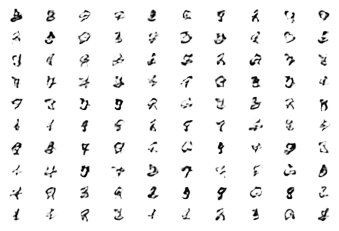

<Figure size 432x288 with 0 Axes>

In [ ]:
discriminator = define_discriminator(in_shape=(32,32,1))
generator = define_generator(32,decoder)
gan = define_gan(generator, discriminator)
generator_trained = train(generator, discriminator, gan, x_train, latent_dim=32,n_epochs=100)

In [ ]:
filename = '/content/drive/MyDrive/Deep Learning /generator_model_100.h5'
generator_trained.save(filename)

The quality of images is not as good as those in the training set (since we reshaped the images to become smaller and made them more blurry than the original ones).
compared with images produced by the AE, the images are more creative.

### Add Conv layer + tanh to generator 

In [ ]:
def define_generator(latent_dim,decoder):
  """The generator model takes as input points in the latent space and outputs a
   single 32x32 grayscale image."""
  model = Sequential()
  n_nodes = 4 * 4 * 8
  model.add(Dense(n_nodes, input_dim=latent_dim))
  model.add(layers.Dense(64))
  model.add(decoder)
  model.add(Conv2D(1, (4,4), activation='tanh', padding='same'))
  return model

Add last conv layer with activation tanh doesnt improve the generator preformances. 

Streaming output truncated to the last 5000 lines.
>10, 150/468, d=0.683, g=0.729
>10, 151/468, d=0.681, g=0.751
>10, 152/468, d=0.670, g=0.705
>10, 153/468, d=0.672, g=0.767
>10, 154/468, d=0.670, g=0.725
>10, 155/468, d=0.668, g=0.729
>10, 156/468, d=0.696, g=0.715
>10, 157/468, d=0.671, g=0.731
>10, 158/468, d=0.661, g=0.765
>10, 159/468, d=0.657, g=0.712
>10, 160/468, d=0.676, g=0.704
>10, 161/468, d=0.658, g=0.796
>10, 162/468, d=0.663, g=0.747
>10, 163/468, d=0.651, g=0.708
>10, 164/468, d=0.651, g=0.778
>10, 165/468, d=0.655, g=0.791
>10, 166/468, d=0.667, g=0.721
>10, 167/468, d=0.674, g=0.694
>10, 168/468, d=0.664, g=0.722
>10, 169/468, d=0.681, g=0.745
>10, 170/468, d=0.668, g=0.695
>10, 171/468, d=0.654, g=0.772
>10, 172/468, d=0.661, g=0.761
>10, 173/468, d=0.667, g=0.722
>10, 174/468, d=0.661, g=0.719
>10, 175/468, d=0.652, g=0.734
>10, 176/468, d=0.662, g=0.744
>10, 177/468, d=0.687, g=0.689
>10, 178/468, d=0.643, g=0.797
>10, 179/468, d=0.697, g=0.685
>10, 180/468, d=0.6

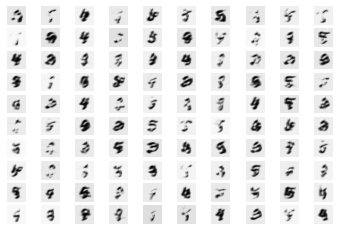

Streaming output truncated to the last 5000 lines.
>30, 150/468, d=0.686, g=0.717
>30, 151/468, d=0.686, g=0.717
>30, 152/468, d=0.679, g=0.709
>30, 153/468, d=0.692, g=0.687
>30, 154/468, d=0.691, g=0.675
>30, 155/468, d=0.695, g=0.702
>30, 156/468, d=0.697, g=0.721
>30, 157/468, d=0.682, g=0.714
>30, 158/468, d=0.699, g=0.688
>30, 159/468, d=0.681, g=0.713
>30, 160/468, d=0.689, g=0.699
>30, 161/468, d=0.700, g=0.684
>30, 162/468, d=0.693, g=0.685
>30, 163/468, d=0.690, g=0.713
>30, 164/468, d=0.681, g=0.724
>30, 165/468, d=0.688, g=0.707
>30, 166/468, d=0.668, g=0.717
>30, 167/468, d=0.701, g=0.693
>30, 168/468, d=0.700, g=0.683
>30, 169/468, d=0.693, g=0.694
>30, 170/468, d=0.700, g=0.732
>30, 171/468, d=0.682, g=0.719
>30, 172/468, d=0.695, g=0.675
>30, 173/468, d=0.684, g=0.704
>30, 174/468, d=0.684, g=0.719
>30, 175/468, d=0.702, g=0.726
>30, 176/468, d=0.673, g=0.698
>30, 177/468, d=0.692, g=0.700
>30, 178/468, d=0.686, g=0.699
>30, 179/468, d=0.683, g=0.711
>30, 180/468, d=0.6

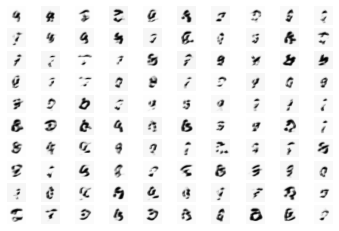

Streaming output truncated to the last 5000 lines.
>50, 150/468, d=0.696, g=0.691
>50, 151/468, d=0.687, g=0.720
>50, 152/468, d=0.688, g=0.708
>50, 153/468, d=0.689, g=0.714
>50, 154/468, d=0.699, g=0.714
>50, 155/468, d=0.697, g=0.704
>50, 156/468, d=0.689, g=0.701
>50, 157/468, d=0.685, g=0.683
>50, 158/468, d=0.688, g=0.707
>50, 159/468, d=0.692, g=0.717
>50, 160/468, d=0.691, g=0.715
>50, 161/468, d=0.687, g=0.719
>50, 162/468, d=0.685, g=0.722
>50, 163/468, d=0.696, g=0.713
>50, 164/468, d=0.688, g=0.692
>50, 165/468, d=0.693, g=0.692
>50, 166/468, d=0.681, g=0.702
>50, 167/468, d=0.685, g=0.723
>50, 168/468, d=0.693, g=0.715
>50, 169/468, d=0.677, g=0.711
>50, 170/468, d=0.704, g=0.692
>50, 171/468, d=0.685, g=0.714
>50, 172/468, d=0.691, g=0.721
>50, 173/468, d=0.682, g=0.712
>50, 174/468, d=0.701, g=0.684
>50, 175/468, d=0.690, g=0.683
>50, 176/468, d=0.689, g=0.696
>50, 177/468, d=0.689, g=0.716
>50, 178/468, d=0.686, g=0.729
>50, 179/468, d=0.684, g=0.708
>50, 180/468, d=0.6

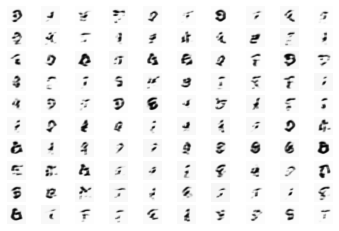

Streaming output truncated to the last 5000 lines.
>70, 150/468, d=0.689, g=0.702
>70, 151/468, d=0.691, g=0.698
>70, 152/468, d=0.688, g=0.701
>70, 153/468, d=0.686, g=0.695
>70, 154/468, d=0.691, g=0.698
>70, 155/468, d=0.689, g=0.712
>70, 156/468, d=0.692, g=0.716
>70, 157/468, d=0.689, g=0.716
>70, 158/468, d=0.689, g=0.704
>70, 159/468, d=0.695, g=0.691
>70, 160/468, d=0.692, g=0.680
>70, 161/468, d=0.687, g=0.679
>70, 162/468, d=0.690, g=0.692
>70, 163/468, d=0.708, g=0.690
>70, 164/468, d=0.683, g=0.696
>70, 165/468, d=0.692, g=0.697
>70, 166/468, d=0.696, g=0.704
>70, 167/468, d=0.684, g=0.707
>70, 168/468, d=0.697, g=0.706
>70, 169/468, d=0.695, g=0.705
>70, 170/468, d=0.691, g=0.698
>70, 171/468, d=0.685, g=0.701
>70, 172/468, d=0.689, g=0.702
>70, 173/468, d=0.699, g=0.694
>70, 174/468, d=0.692, g=0.692
>70, 175/468, d=0.692, g=0.693
>70, 176/468, d=0.696, g=0.701
>70, 177/468, d=0.694, g=0.703
>70, 178/468, d=0.697, g=0.696
>70, 179/468, d=0.696, g=0.695
>70, 180/468, d=0.6

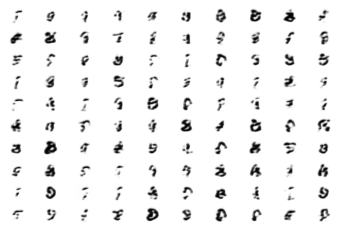

Streaming output truncated to the last 5000 lines.
>90, 150/468, d=0.689, g=0.699
>90, 151/468, d=0.694, g=0.691
>90, 152/468, d=0.691, g=0.691
>90, 153/468, d=0.695, g=0.693
>90, 154/468, d=0.688, g=0.695
>90, 155/468, d=0.688, g=0.697
>90, 156/468, d=0.692, g=0.696
>90, 157/468, d=0.687, g=0.695
>90, 158/468, d=0.698, g=0.698
>90, 159/468, d=0.688, g=0.696
>90, 160/468, d=0.693, g=0.702
>90, 161/468, d=0.689, g=0.705
>90, 162/468, d=0.692, g=0.696
>90, 163/468, d=0.701, g=0.683
>90, 164/468, d=0.688, g=0.692
>90, 165/468, d=0.694, g=0.701
>90, 166/468, d=0.694, g=0.704
>90, 167/468, d=0.696, g=0.697
>90, 168/468, d=0.688, g=0.697
>90, 169/468, d=0.694, g=0.704
>90, 170/468, d=0.689, g=0.703
>90, 171/468, d=0.697, g=0.699
>90, 172/468, d=0.697, g=0.688
>90, 173/468, d=0.693, g=0.691
>90, 174/468, d=0.692, g=0.701
>90, 175/468, d=0.688, g=0.716
>90, 176/468, d=0.691, g=0.710
>90, 177/468, d=0.690, g=0.710
>90, 178/468, d=0.699, g=0.693
>90, 179/468, d=0.690, g=0.699
>90, 180/468, d=0.6

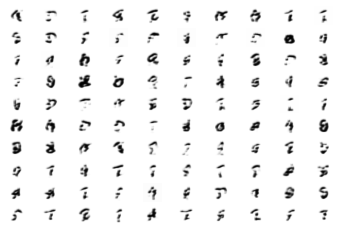

<Figure size 432x288 with 0 Axes>

In [41]:
discriminator = define_discriminator(in_shape=(32,32,1))
generator = define_generator(32,decoder)
gan = define_gan(generator, discriminator)
generator_trained = train(generator, discriminator, gan, x_train, latent_dim=32,n_epochs=100)

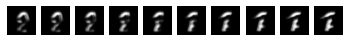

In [49]:
# generate points in latent space
latent_dim = 32
pts = generate_latent_points(latent_dim, 128)
inter_plots(pts,generator_trained)

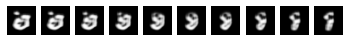

In [60]:
# generate points in latent space
latent_dim = 32
pts = generate_latent_points(latent_dim, 128)
inter_plots(pts,generator_trained)

### Interpolation Compration

Interpolating between digits can be done by aL1+(1-a)L2 where L1 and L2 are the latent codes of two different digits and a is a value that increases from 0 to 1. Show the results you get when interpolating in the AE’s latent space compared to the ones in the GAN’s latent space. Explain which strategy produces better results and why.

In [ ]:
def interpolate_points(p1, p2, n_steps=10):
  """This function perform uniform interpolation between two points in latent space.
  The ratio increases from 0 to 1 with 10 steps.
  """
  # interpolate ratios between the points
  ratios = linspace(0, 1, num=n_steps)
  # linear interpolate vectors
  vectors = list()
  for ratio in ratios:
    v = (1.0 - ratio) * p1 + ratio * p2
    vectors.append(v)
  return asarray(vectors)

# create a plot of generated images
def plot_generated(examples, n):
  """This function plot the interpolated images"""
  for i in range(n):
    plt.subplot(1, n, 1 + i)
    plt.axis('off')
    # plot raw pixel data
    plt.imshow(examples[i, :, :, 0],cmap = 'gray')
  plt.show()



In [44]:
def inter_plots(pts,model):
  # interpolate points in latent space
  interpolated = interpolate_points(pts[0], pts[1])
  # generate images
  X = model.predict(interpolated)
  # scale from [-1,1] to [0,1]
  X = (X + 1) / 2.0
  plot_generated(X, len(interpolated))

#### GAN

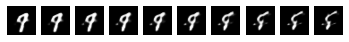

In [ ]:
# generate points in latent space
latent_dim = 32
pts = generate_latent_points(latent_dim, 128)
inter_plots(pts,generator_trained)

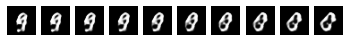

In [ ]:
pts = generate_latent_points(latent_dim, 128)
inter_plots(pts,generator_trained)

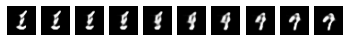

In [ ]:
pts = generate_latent_points(latent_dim, 128)
inter_plots(pts,generator_trained)

#### Auto Encoder

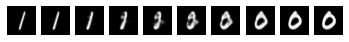

In [ ]:
pts = encoder.predict(x_test[2:4])
inter_plots(pts,decoder)

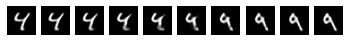

In [ ]:
pts = encoder.predict(x_test[6:8])
inter_plots(pts,decoder)

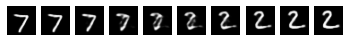

In [ ]:
pts = encoder.predict(x_test[:2])
inter_plots(pts,decoder)

## Train model 50 epochs

Streaming output truncated to the last 5000 lines.
>4, 153/468, d=0.651, g=0.766
>4, 154/468, d=0.670, g=0.728
>4, 155/468, d=0.647, g=0.748
>4, 156/468, d=0.631, g=0.756
>4, 157/468, d=0.698, g=0.756
>4, 158/468, d=0.631, g=0.738
>4, 159/468, d=0.660, g=0.777
>4, 160/468, d=0.666, g=0.797
>4, 161/468, d=0.656, g=0.786
>4, 162/468, d=0.673, g=0.813
>4, 163/468, d=0.735, g=0.768
>4, 164/468, d=0.648, g=0.787
>4, 165/468, d=0.708, g=0.771
>4, 166/468, d=0.645, g=0.817
>4, 167/468, d=0.659, g=0.822
>4, 168/468, d=0.690, g=0.769
>4, 169/468, d=0.657, g=0.810
>4, 170/468, d=0.694, g=0.727
>4, 171/468, d=0.649, g=0.762
>4, 172/468, d=0.666, g=0.725
>4, 173/468, d=0.667, g=0.748
>4, 174/468, d=0.606, g=0.804
>4, 175/468, d=0.643, g=0.788
>4, 176/468, d=0.691, g=0.721
>4, 177/468, d=0.675, g=0.720
>4, 178/468, d=0.691, g=0.800
>4, 179/468, d=0.682, g=0.823
>4, 180/468, d=0.656, g=0.802
>4, 181/468, d=0.649, g=0.803
>4, 182/468, d=0.654, g=0.720
>4, 183/468, d=0.672, g=0.696
>4, 184/468, d=0.61

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


Streaming output truncated to the last 5000 lines.
>41, 149/468, d=0.664, g=0.700
>41, 150/468, d=0.687, g=0.726
>41, 151/468, d=0.697, g=0.744
>41, 152/468, d=0.687, g=0.710
>41, 153/468, d=0.683, g=0.691
>41, 154/468, d=0.679, g=0.735
>41, 155/468, d=0.678, g=0.738
>41, 156/468, d=0.678, g=0.689
>41, 157/468, d=0.672, g=0.757
>41, 158/468, d=0.698, g=0.714
>41, 159/468, d=0.682, g=0.668
>41, 160/468, d=0.696, g=0.693
>41, 161/468, d=0.687, g=0.710
>41, 162/468, d=0.685, g=0.732
>41, 163/468, d=0.681, g=0.711
>41, 164/468, d=0.684, g=0.713
>41, 165/468, d=0.691, g=0.687
>41, 166/468, d=0.672, g=0.701
>41, 167/468, d=0.683, g=0.723
>41, 168/468, d=0.704, g=0.710
>41, 169/468, d=0.683, g=0.733
>41, 170/468, d=0.697, g=0.692
>41, 171/468, d=0.687, g=0.700
>41, 172/468, d=0.690, g=0.672
>41, 173/468, d=0.699, g=0.710
>41, 174/468, d=0.680, g=0.738
>41, 175/468, d=0.677, g=0.701
>41, 176/468, d=0.693, g=0.688
>41, 177/468, d=0.671, g=0.726
>41, 178/468, d=0.699, g=0.711
>41, 179/468, d=0.6

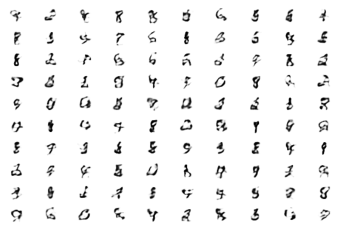

In [ ]:
discriminator = define_discriminator(in_shape=(32,32,1))
generator = define_generator(32,decoder)
gan = define_gan(generator, discriminator)
generator_trained = train(generator, discriminator, gan, x_train, latent_dim=32)

In [ ]:
filename = '/content/drive/MyDrive/Deep Learning /generator_model_50_128.h5'
generator_trained.save(filename)

## Train model 10 epochs

In [ ]:
discriminator = define_discriminator(in_shape=(32,32,1))
generator = define_generator(32,decoder)
gan = define_gan(generator, discriminator)
gen = train(generator_trained, discriminator, gan, x_train, latent_dim=32,n_epochs = 10)

>1, 1/468, d=0.687, g=0.735
>1, 2/468, d=0.669, g=0.736
>1, 3/468, d=0.677, g=0.722
>1, 4/468, d=0.675, g=0.685
>1, 5/468, d=0.671, g=0.717
>1, 6/468, d=0.693, g=0.731
>1, 7/468, d=0.678, g=0.727
>1, 8/468, d=0.685, g=0.695
>1, 9/468, d=0.678, g=0.719
>1, 10/468, d=0.675, g=0.709
>1, 11/468, d=0.691, g=0.727
>1, 12/468, d=0.686, g=0.715
>1, 13/468, d=0.692, g=0.701
>1, 14/468, d=0.686, g=0.701
>1, 15/468, d=0.693, g=0.702
>1, 16/468, d=0.665, g=0.721
>1, 17/468, d=0.693, g=0.728
>1, 18/468, d=0.680, g=0.710
>1, 19/468, d=0.673, g=0.726
>1, 20/468, d=0.692, g=0.712
>1, 21/468, d=0.692, g=0.692
>1, 22/468, d=0.668, g=0.731
>1, 23/468, d=0.665, g=0.719
>1, 24/468, d=0.676, g=0.733
>1, 25/468, d=0.684, g=0.706
>1, 26/468, d=0.671, g=0.708
>1, 27/468, d=0.691, g=0.706
>1, 28/468, d=0.685, g=0.706
>1, 29/468, d=0.675, g=0.742
>1, 30/468, d=0.677, g=0.728
>1, 31/468, d=0.677, g=0.720
>1, 32/468, d=0.685, g=0.726
>1, 33/468, d=0.685, g=0.725
>1, 34/468, d=0.700, g=0.693
>1, 35/468, d=0.688, g=

## Sampled Digits

In [ ]:
def show_generated_images(examples, n):
	# plot n*n images
	for i in range(n * n):
		plt.subplot(n, n, 1 + i)
		plt.axis('off')
		plt.imshow(examples[i, :, :, 0], cmap='gray_r')
	plt.show()

 Show several sampled digits.

In [ ]:
	# save the generator
	filename = '/content/drive/MyDrive/Deep Learning /generator_model_50.h5'
	generator_trained.save(filename)

50 epochs model

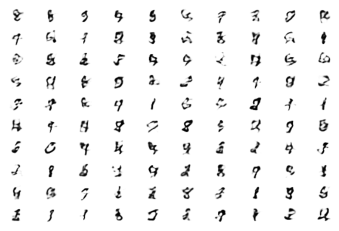

In [ ]:
latent_points = generate_latent_points(32, 128)
# generate images
X = generator_trained.predict(latent_points)
# plot the result
show_generated_images(X, 10) 

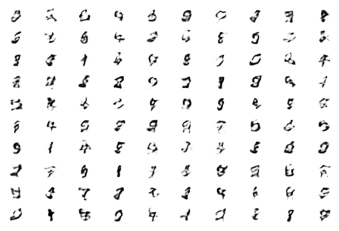

In [ ]:
latent_points = generate_latent_points(32, 128)
# generate images
X = gen.predict(latent_points)
# plot the result
show_generated_images(X, 10) 

# Digit-Specific Generator.

GANs can be extended to a conditional model if both the generator and discriminator are conditioned on some extra information y. We can perform the conditioning by feeding y into the both the discriminator and generator as additional input layer.

In [19]:
autoencoder, encoder , decoder = build_AE(latent_dim)
autoencoder.load_weights(checkpoint_path)

In [20]:
# The decoder weights are not updated
decoder.trainable = False
decoder.compile(optimizer='adam', loss='binary_crossentropy')

In [125]:
def define_discriminator(in_shape=(32,32,1), n_classes=10):
  in_label = Input(shape=(1,)) 
  li = Embedding(n_classes, 20)(in_label)
  # scale up to image dimensions 
  n_nodes = in_shape[0] * in_shape[1]
  li = Dense(n_nodes)(in_label)
  # reshape to additional channel
  li = Reshape((in_shape[0], in_shape[1], 1))(li)
  
  in_image = Input(shape=in_shape)
  
  merge = Concatenate()([in_image, li])
  x = Conv2D(64, (3,3), strides=(2, 2), padding='same')(merge)
  # x = LeakyReLU(alpha=0.2)(x)

  x = Conv2D(64, (3,3), strides=(2, 2), padding='same')(x)

  flat = Flatten()(x)

  out_layer = Dense(1, activation='sigmoid')(flat)
  model = Model([in_image, in_label], out_layer)
  opt = Adam(lr=0.0001, beta_1=0.5)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  return model

In [68]:
def define_generator(latent_dim, n_classes=10):
  # label input
  in_label = Input(shape=(1,))
  li = Embedding(n_classes, 65)(in_label)

  n_nodes = 32 * 32 * 16
  li = Dense(n_nodes)(li)
  # reshape to additional channel
  li = Reshape((32, 32, 16))(li)
  # image generator input
  in_lat = Input(shape=(latent_dim,))
  inp = Dense(64)(in_lat)
  decoded = decoder(inp)

  # concat the image and the label after decoding 
  merge = Concatenate()([decoded, li])
  out_layer = Conv2D(1, (4,4), activation='tanh', padding='same')(merge)

  model = Model([in_lat, in_label], out_layer)
  return model

In [61]:
def define_gan(g_model, d_model):
	d_model.trainable = False
	gen_noise, gen_label = g_model.input
	gen_output = g_model.output
	gan_output = d_model([gen_output, gen_label])
	model = Model([gen_noise, gen_label], gan_output)
	opt = Adam(lr=0.0001, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

In [11]:
def generate_real_samples(dataset, n_samples):
	images, labels = dataset
	ix = randint(0, images.shape[0], n_samples)
	X, labels = images[ix], labels[ix]
	y = np.ones((n_samples, 1))
	return [X, labels], y

def generate_latent_points(latent_dim, n_samples,y, n_classes=10):
  x_input = randn(latent_dim * n_samples)
  z_input = x_input.reshape(n_samples, latent_dim)
  ind = randint(0, n_classes, n_samples)
  # for categorial labels
  labels = y[ind]
  return [z_input, labels]
 
def generate_fake_samples(generator, latent_dim, n_samples,y):
	# generate points in latent space
	z_input, labels_input = generate_latent_points(latent_dim, n_samples,y)
	images = generator.predict([z_input, labels_input])
	y = np.zeros((n_samples, 1))
	return [images, labels_input], y

In [126]:
def train_cgan(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=10, n_batch=128):
  bat_per_epo = int(dataset[0].shape[0] / n_batch)
  half_batch = int(n_batch / 2)
  losses = []
  for i in range(n_epochs):
    for j in range(bat_per_epo):
      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
      d_loss_real, _ = d_model.train_on_batch([X_real, labels_real], y_real)
      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch,dataset[1])
      d_loss_fake, _ = d_model.train_on_batch([X_fake, labels], y_fake)
      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch,dataset[1])
      y_gan = np.ones((n_batch, 1))
      g_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)

      # print results 
      print('>%d, %d/%d, discriminator loss real =%.3f, fake =%.3f generator loss=%.3f' % (i+1, j+1, bat_per_epo, d_loss_real, d_loss_fake, g_loss))
    if (i+1) % 10 == 0:
      losses.append(((d_loss_real+d_loss_fake)/2, g_loss))
      # generate images
      X  = g_model.predict([z_input, labels_input])
      X = (X + 1) / 2.0
      plot_digits(X, 5,5)
  # save the generator model
  g_model.save('/content/drive/MyDrive/Deep Learning /my_cgan_generator_emb.h5')
  show_losses(losses)


In [26]:
def show_losses(losses):
    losses = np.array(losses)
    
    fig, ax = plt.subplots()
    plt.plot(losses.T[0], label='Discriminator')
    plt.plot(losses.T[1], label='Generator')
    plt.title("Validation Losses")
    plt.legend()
    plt.show()

In [7]:
def plot_specified_digit(y,model,latent_dim):
  latent_points, labels = generate_latent_points(latent_dim, 10,y)
  X  = model.predict([latent_points, y])
  # scale from [-1,1] to [0,1]
  X = (X + 1) / 2.0
  plot_digits(X, 2,5)

In [8]:
def plot_digits(examples, n,m):
	# plot images
	for i in range(n * m):
		# define subplot
		plt.subplot(n, m, 1 + i)
		# turn off axis
		plt.axis('off')
		# plot raw pixel data
		plt.imshow(examples[i, :, :, 0], cmap='gray_r')
	plt.show()

## Concatenate befor decoding 

In [61]:
def define_generator(latent_dim, n_classes=10):
  n_nodes = 1 * 1 * 8
  in_lat = Input(shape=(latent_dim,))
  gen = Dense(n_nodes) (in_lat)
  gen = Reshape((1, 1, 8))(gen)

   # label input
  in_label = Input(shape=(1,))
  li = Embedding(n_classes, 20)(in_label)

  n_nodes = 1 * 1 * 24
  li = Dense(n_nodes)(li)
  # reshape to additional channel
  li = Reshape((1, 1, 24))(li)
  # Concat before decoding
  merge = Concatenate()([gen, li])

  gen = Dense(64)(merge)

  print(gen.shape)
  decoded = decoder (gen)

  out_layer = Conv2D(1, (4,4), activation='tanh', padding='same')(decoded)

  model = Model([in_lat, in_label], out_layer)
  return model

### 100 epochs latent dim = 32 , btach size = 128 , embedding size = 20

(None, 1, 1, 64)
>1, 1/468, discriminator loss real =0.687, fake =0.740 generator loss=0.652
>1, 2/468, discriminator loss real =0.666, fake =0.741 generator loss=0.653
>1, 3/468, discriminator loss real =0.650, fake =0.741 generator loss=0.655
>1, 4/468, discriminator loss real =0.645, fake =0.739 generator loss=0.656
>1, 5/468, discriminator loss real =0.640, fake =0.734 generator loss=0.662
>1, 6/468, discriminator loss real =0.636, fake =0.730 generator loss=0.662
>1, 7/468, discriminator loss real =0.625, fake =0.730 generator loss=0.667
>1, 8/468, discriminator loss real =0.623, fake =0.720 generator loss=0.668
>1, 9/468, discriminator loss real =0.616, fake =0.726 generator loss=0.673
>1, 10/468, discriminator loss real =0.606, fake =0.723 generator loss=0.675
>1, 11/468, discriminator loss real =0.602, fake =0.721 generator loss=0.676
>1, 12/468, discriminator loss real =0.594, fake =0.720 generator loss=0.682
>1, 13/468, discriminator loss real =0.591, fake =0.704 generator lo

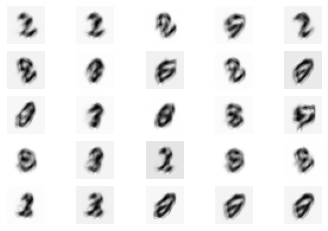

>11, 1/468, discriminator loss real =0.662, fake =0.616 generator loss=0.882
>11, 2/468, discriminator loss real =0.674, fake =0.612 generator loss=0.857
>11, 3/468, discriminator loss real =0.643, fake =0.670 generator loss=0.840
>11, 4/468, discriminator loss real =0.607, fake =0.682 generator loss=0.863
>11, 5/468, discriminator loss real =0.647, fake =0.621 generator loss=0.885
>11, 6/468, discriminator loss real =0.645, fake =0.582 generator loss=0.865
>11, 7/468, discriminator loss real =0.678, fake =0.664 generator loss=0.818
>11, 8/468, discriminator loss real =0.698, fake =0.674 generator loss=0.854
>11, 9/468, discriminator loss real =0.612, fake =0.656 generator loss=0.822
>11, 10/468, discriminator loss real =0.519, fake =0.628 generator loss=0.889
>11, 11/468, discriminator loss real =0.670, fake =0.606 generator loss=0.830
>11, 12/468, discriminator loss real =0.690, fake =0.571 generator loss=0.863
>11, 13/468, discriminator loss real =0.584, fake =0.680 generator loss=0

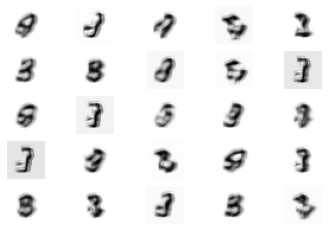

>21, 1/468, discriminator loss real =0.673, fake =0.606 generator loss=0.848
>21, 2/468, discriminator loss real =0.705, fake =0.577 generator loss=0.839
>21, 3/468, discriminator loss real =0.667, fake =0.634 generator loss=0.838
>21, 4/468, discriminator loss real =0.698, fake =0.640 generator loss=0.812
>21, 5/468, discriminator loss real =0.625, fake =0.654 generator loss=0.819
>21, 6/468, discriminator loss real =0.658, fake =0.650 generator loss=0.816
>21, 7/468, discriminator loss real =0.666, fake =0.593 generator loss=0.830
>21, 8/468, discriminator loss real =0.702, fake =0.631 generator loss=0.827
>21, 9/468, discriminator loss real =0.710, fake =0.565 generator loss=0.812
>21, 10/468, discriminator loss real =0.694, fake =0.748 generator loss=0.800
>21, 11/468, discriminator loss real =0.612, fake =0.592 generator loss=0.811
>21, 12/468, discriminator loss real =0.684, fake =0.611 generator loss=0.806
>21, 13/468, discriminator loss real =0.630, fake =0.644 generator loss=0

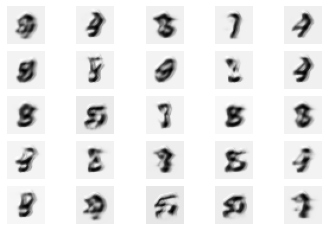

>31, 1/468, discriminator loss real =0.670, fake =0.642 generator loss=0.803
>31, 2/468, discriminator loss real =0.609, fake =0.631 generator loss=0.805
>31, 3/468, discriminator loss real =0.697, fake =0.684 generator loss=0.807
>31, 4/468, discriminator loss real =0.724, fake =0.648 generator loss=0.826
>31, 5/468, discriminator loss real =0.651, fake =0.715 generator loss=0.814
>31, 6/468, discriminator loss real =0.639, fake =0.653 generator loss=0.811
>31, 7/468, discriminator loss real =0.621, fake =0.687 generator loss=0.822
>31, 8/468, discriminator loss real =0.721, fake =0.590 generator loss=0.810
>31, 9/468, discriminator loss real =0.690, fake =0.663 generator loss=0.800
>31, 10/468, discriminator loss real =0.650, fake =0.678 generator loss=0.830
>31, 11/468, discriminator loss real =0.619, fake =0.594 generator loss=0.789
>31, 12/468, discriminator loss real =0.712, fake =0.597 generator loss=0.796
>31, 13/468, discriminator loss real =0.676, fake =0.671 generator loss=0

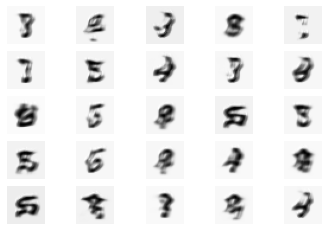

>41, 1/468, discriminator loss real =0.601, fake =0.639 generator loss=0.786
>41, 2/468, discriminator loss real =0.697, fake =0.633 generator loss=0.802
>41, 3/468, discriminator loss real =0.663, fake =0.658 generator loss=0.763
>41, 4/468, discriminator loss real =0.645, fake =0.652 generator loss=0.809
>41, 5/468, discriminator loss real =0.661, fake =0.656 generator loss=0.822
>41, 6/468, discriminator loss real =0.634, fake =0.665 generator loss=0.814
>41, 7/468, discriminator loss real =0.654, fake =0.652 generator loss=0.790
>41, 8/468, discriminator loss real =0.683, fake =0.659 generator loss=0.816
>41, 9/468, discriminator loss real =0.620, fake =0.644 generator loss=0.812
>41, 10/468, discriminator loss real =0.634, fake =0.635 generator loss=0.762
>41, 11/468, discriminator loss real =0.676, fake =0.659 generator loss=0.751
>41, 12/468, discriminator loss real =0.715, fake =0.717 generator loss=0.755
>41, 13/468, discriminator loss real =0.674, fake =0.655 generator loss=0

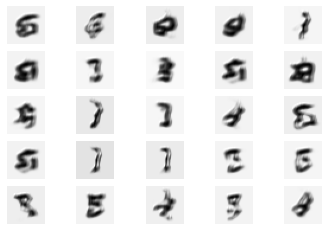

>51, 1/468, discriminator loss real =0.647, fake =0.631 generator loss=0.811
>51, 2/468, discriminator loss real =0.649, fake =0.646 generator loss=0.785
>51, 3/468, discriminator loss real =0.678, fake =0.627 generator loss=0.771
>51, 4/468, discriminator loss real =0.651, fake =0.669 generator loss=0.789
>51, 5/468, discriminator loss real =0.639, fake =0.682 generator loss=0.778
>51, 6/468, discriminator loss real =0.753, fake =0.722 generator loss=0.790
>51, 7/468, discriminator loss real =0.649, fake =0.667 generator loss=0.807
>51, 8/468, discriminator loss real =0.631, fake =0.682 generator loss=0.791
>51, 9/468, discriminator loss real =0.704, fake =0.646 generator loss=0.769
>51, 10/468, discriminator loss real =0.644, fake =0.636 generator loss=0.835
>51, 11/468, discriminator loss real =0.609, fake =0.669 generator loss=0.763
>51, 12/468, discriminator loss real =0.673, fake =0.615 generator loss=0.806
>51, 13/468, discriminator loss real =0.696, fake =0.631 generator loss=0

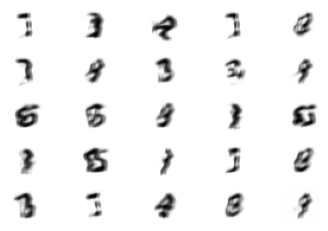

>61, 1/468, discriminator loss real =0.638, fake =0.663 generator loss=0.802
>61, 2/468, discriminator loss real =0.726, fake =0.728 generator loss=0.781
>61, 3/468, discriminator loss real =0.616, fake =0.666 generator loss=0.833
>61, 4/468, discriminator loss real =0.648, fake =0.599 generator loss=0.834
>61, 5/468, discriminator loss real =0.716, fake =0.614 generator loss=0.828
>61, 6/468, discriminator loss real =0.700, fake =0.628 generator loss=0.791
>61, 7/468, discriminator loss real =0.593, fake =0.679 generator loss=0.792
>61, 8/468, discriminator loss real =0.671, fake =0.622 generator loss=0.786
>61, 9/468, discriminator loss real =0.675, fake =0.650 generator loss=0.821
>61, 10/468, discriminator loss real =0.674, fake =0.637 generator loss=0.769
>61, 11/468, discriminator loss real =0.650, fake =0.608 generator loss=0.797
>61, 12/468, discriminator loss real =0.667, fake =0.630 generator loss=0.812
>61, 13/468, discriminator loss real =0.708, fake =0.628 generator loss=0

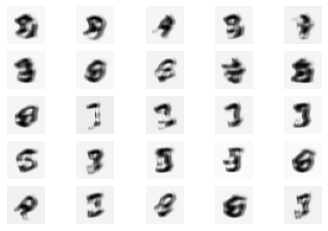

>71, 1/468, discriminator loss real =0.694, fake =0.671 generator loss=0.782
>71, 2/468, discriminator loss real =0.599, fake =0.651 generator loss=0.837
>71, 3/468, discriminator loss real =0.661, fake =0.751 generator loss=0.808
>71, 4/468, discriminator loss real =0.746, fake =0.679 generator loss=0.794
>71, 5/468, discriminator loss real =0.650, fake =0.664 generator loss=0.773
>71, 6/468, discriminator loss real =0.620, fake =0.663 generator loss=0.792
>71, 7/468, discriminator loss real =0.638, fake =0.626 generator loss=0.821
>71, 8/468, discriminator loss real =0.612, fake =0.657 generator loss=0.837
>71, 9/468, discriminator loss real =0.671, fake =0.631 generator loss=0.813
>71, 10/468, discriminator loss real =0.695, fake =0.661 generator loss=0.781
>71, 11/468, discriminator loss real =0.631, fake =0.651 generator loss=0.823
>71, 12/468, discriminator loss real =0.634, fake =0.619 generator loss=0.815
>71, 13/468, discriminator loss real =0.645, fake =0.713 generator loss=0

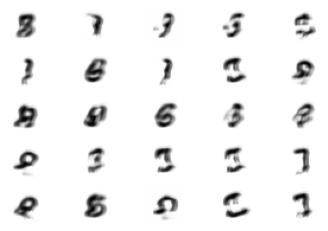

>81, 1/468, discriminator loss real =0.660, fake =0.614 generator loss=0.800
>81, 2/468, discriminator loss real =0.664, fake =0.633 generator loss=0.803
>81, 3/468, discriminator loss real =0.660, fake =0.671 generator loss=0.779
>81, 4/468, discriminator loss real =0.602, fake =0.635 generator loss=0.783
>81, 5/468, discriminator loss real =0.640, fake =0.645 generator loss=0.744
>81, 6/468, discriminator loss real =0.654, fake =0.677 generator loss=0.787
>81, 7/468, discriminator loss real =0.622, fake =0.647 generator loss=0.806
>81, 8/468, discriminator loss real =0.662, fake =0.645 generator loss=0.799
>81, 9/468, discriminator loss real =0.642, fake =0.650 generator loss=0.824
>81, 10/468, discriminator loss real =0.606, fake =0.716 generator loss=0.781
>81, 11/468, discriminator loss real =0.649, fake =0.636 generator loss=0.799
>81, 12/468, discriminator loss real =0.650, fake =0.704 generator loss=0.791
>81, 13/468, discriminator loss real =0.681, fake =0.715 generator loss=0

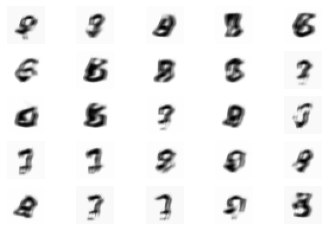

>91, 1/468, discriminator loss real =0.649, fake =0.624 generator loss=0.801
>91, 2/468, discriminator loss real =0.682, fake =0.632 generator loss=0.777
>91, 3/468, discriminator loss real =0.694, fake =0.643 generator loss=0.804
>91, 4/468, discriminator loss real =0.664, fake =0.578 generator loss=0.797
>91, 5/468, discriminator loss real =0.609, fake =0.607 generator loss=0.780
>91, 6/468, discriminator loss real =0.597, fake =0.655 generator loss=0.793
>91, 7/468, discriminator loss real =0.640, fake =0.745 generator loss=0.810
>91, 8/468, discriminator loss real =0.628, fake =0.683 generator loss=0.775
>91, 9/468, discriminator loss real =0.643, fake =0.716 generator loss=0.821
>91, 10/468, discriminator loss real =0.743, fake =0.648 generator loss=0.805
>91, 11/468, discriminator loss real =0.646, fake =0.670 generator loss=0.773
>91, 12/468, discriminator loss real =0.676, fake =0.650 generator loss=0.808
>91, 13/468, discriminator loss real =0.652, fake =0.687 generator loss=0

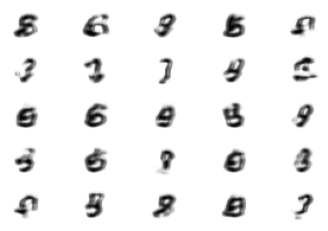

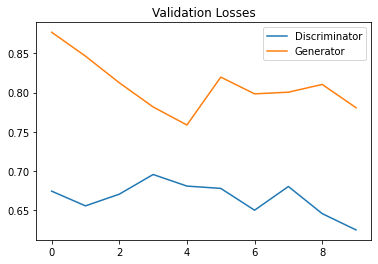

In [127]:
dataset = (x_train,y_train)
disc = define_discriminator()
gen_model = define_generator(32)
gan_model = define_gan(gen_model, disc)
train_cgan(gen_model, disc, gan_model, dataset, latent_dim = 32,n_epochs = 100 ,n_batch=128)

In [9]:
cgan = load_model('/content/drive/MyDrive/Deep Learning /my_cgan_generator_emb.h5')

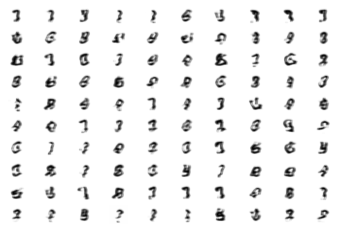

In [22]:
y = np.zeros(100)
latent_points, labels = generate_latent_points(32, 100,y)
X  = cgan.predict([latent_points, y])
X = (X + 1) / 2.0
plot_digits(X, 10,10)

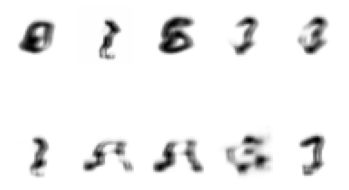

In [12]:
y = np.arange(10)
plot_specified_digit(y,cgan,32)

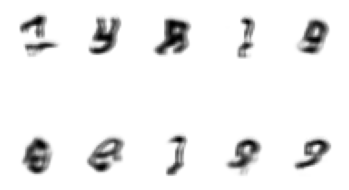

In [13]:
y = np.zeros(10)
plot_specified_digit(y,cgan,32)

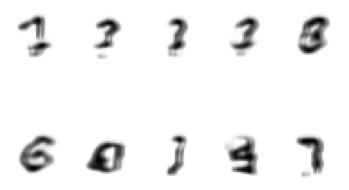

In [14]:
y = np.ones(10)
plot_specified_digit(y,cgan,32)

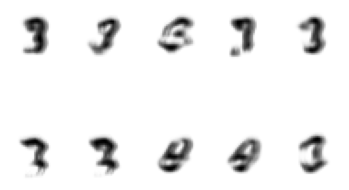

In [16]:
y = np.array([3,3,3,3,3,3,3,3,3,3])
plot_specified_digit(y,cgan,32)

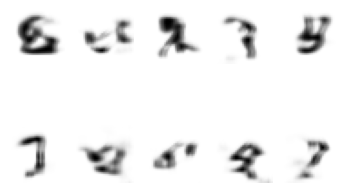

In [19]:
y = np.array([8,8,8,8,8,8,8,8,8,8])
plot_specified_digit(y,cgan,32)

### 50 epochs latent dim = 32 , btach size = 128 , embedding size = 65

(None, 1, 1, 64)
>1, 1/468, discriminator loss real =0.719, fake =0.696 generator loss=0.691
>1, 2/468, discriminator loss real =0.690, fake =0.700 generator loss=0.688
>1, 3/468, discriminator loss real =0.681, fake =0.704 generator loss=0.686
>1, 4/468, discriminator loss real =0.672, fake =0.706 generator loss=0.683
>1, 5/468, discriminator loss real =0.664, fake =0.708 generator loss=0.681
>1, 6/468, discriminator loss real =0.653, fake =0.710 generator loss=0.679
>1, 7/468, discriminator loss real =0.641, fake =0.712 generator loss=0.678
>1, 8/468, discriminator loss real =0.637, fake =0.714 generator loss=0.677
>1, 9/468, discriminator loss real =0.630, fake =0.713 generator loss=0.675
>1, 10/468, discriminator loss real =0.621, fake =0.717 generator loss=0.675
>1, 11/468, discriminator loss real =0.609, fake =0.717 generator loss=0.672
>1, 12/468, discriminator loss real =0.597, fake =0.722 generator loss=0.672
>1, 13/468, discriminator loss real =0.586, fake =0.723 generator lo

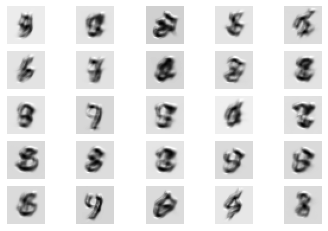

>11, 1/468, discriminator loss real =0.765, fake =0.625 generator loss=0.845
>11, 2/468, discriminator loss real =0.653, fake =0.751 generator loss=0.915
>11, 3/468, discriminator loss real =0.546, fake =0.584 generator loss=0.917
>11, 4/468, discriminator loss real =0.593, fake =0.587 generator loss=0.883
>11, 5/468, discriminator loss real =0.747, fake =0.571 generator loss=0.900
>11, 6/468, discriminator loss real =0.548, fake =0.615 generator loss=0.882
>11, 7/468, discriminator loss real =0.762, fake =0.576 generator loss=0.879
>11, 8/468, discriminator loss real =0.577, fake =0.683 generator loss=0.887
>11, 9/468, discriminator loss real =0.664, fake =0.670 generator loss=0.924
>11, 10/468, discriminator loss real =0.693, fake =0.627 generator loss=0.900
>11, 11/468, discriminator loss real =0.642, fake =0.652 generator loss=0.881
>11, 12/468, discriminator loss real =0.673, fake =0.650 generator loss=0.933
>11, 13/468, discriminator loss real =0.707, fake =0.588 generator loss=0

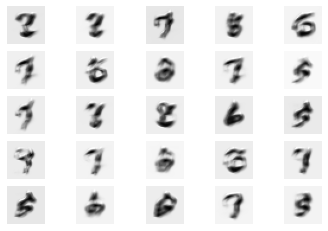

>21, 1/468, discriminator loss real =0.703, fake =0.717 generator loss=0.780
>21, 2/468, discriminator loss real =0.697, fake =0.618 generator loss=0.807
>21, 3/468, discriminator loss real =0.675, fake =0.635 generator loss=0.794
>21, 4/468, discriminator loss real =0.646, fake =0.682 generator loss=0.815
>21, 5/468, discriminator loss real =0.618, fake =0.728 generator loss=0.790
>21, 6/468, discriminator loss real =0.736, fake =0.693 generator loss=0.818
>21, 7/468, discriminator loss real =0.705, fake =0.680 generator loss=0.810
>21, 8/468, discriminator loss real =0.652, fake =0.639 generator loss=0.813
>21, 9/468, discriminator loss real =0.666, fake =0.718 generator loss=0.819
>21, 10/468, discriminator loss real =0.618, fake =0.599 generator loss=0.830
>21, 11/468, discriminator loss real =0.676, fake =0.569 generator loss=0.851
>21, 12/468, discriminator loss real =0.711, fake =0.666 generator loss=0.812
>21, 13/468, discriminator loss real =0.674, fake =0.696 generator loss=0

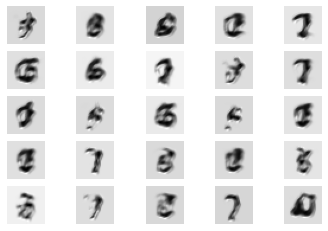

>31, 1/468, discriminator loss real =0.679, fake =0.635 generator loss=0.829
>31, 2/468, discriminator loss real =0.675, fake =0.615 generator loss=0.798
>31, 3/468, discriminator loss real =0.692, fake =0.684 generator loss=0.831
>31, 4/468, discriminator loss real =0.666, fake =0.647 generator loss=0.810
>31, 5/468, discriminator loss real =0.654, fake =0.656 generator loss=0.807
>31, 6/468, discriminator loss real =0.653, fake =0.642 generator loss=0.797
>31, 7/468, discriminator loss real =0.648, fake =0.664 generator loss=0.790
>31, 8/468, discriminator loss real =0.668, fake =0.627 generator loss=0.839
>31, 9/468, discriminator loss real =0.639, fake =0.647 generator loss=0.834
>31, 10/468, discriminator loss real =0.615, fake =0.567 generator loss=0.823
>31, 11/468, discriminator loss real =0.601, fake =0.633 generator loss=0.826
>31, 12/468, discriminator loss real =0.643, fake =0.656 generator loss=0.832
>31, 13/468, discriminator loss real =0.688, fake =0.625 generator loss=0

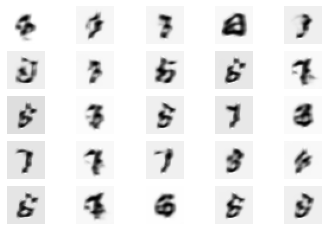

>41, 1/468, discriminator loss real =0.652, fake =0.678 generator loss=0.855
>41, 2/468, discriminator loss real =0.701, fake =0.652 generator loss=0.850
>41, 3/468, discriminator loss real =0.673, fake =0.716 generator loss=0.775
>41, 4/468, discriminator loss real =0.618, fake =0.661 generator loss=0.791
>41, 5/468, discriminator loss real =0.667, fake =0.646 generator loss=0.787
>41, 6/468, discriminator loss real =0.649, fake =0.633 generator loss=0.852
>41, 7/468, discriminator loss real =0.700, fake =0.644 generator loss=0.814
>41, 8/468, discriminator loss real =0.615, fake =0.751 generator loss=0.810
>41, 9/468, discriminator loss real =0.692, fake =0.644 generator loss=0.784
>41, 10/468, discriminator loss real =0.643, fake =0.611 generator loss=0.858
>41, 11/468, discriminator loss real =0.638, fake =0.650 generator loss=0.831
>41, 12/468, discriminator loss real =0.704, fake =0.638 generator loss=0.771
>41, 13/468, discriminator loss real =0.649, fake =0.668 generator loss=0

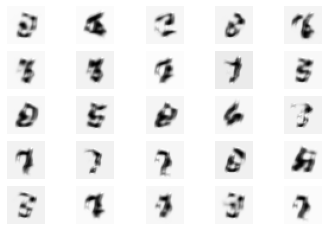

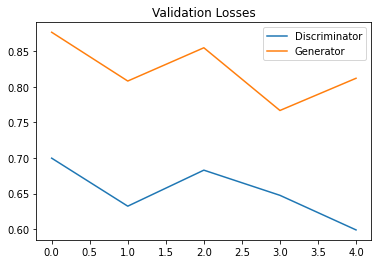

In [111]:
dataset = (x_train,y_train)
disc = define_discriminator()
gen_model = define_generator(32)
gan_model = define_gan(gen_model, disc)
train_cgan(gen_model, disc, gan_model, dataset, latent_dim = 32,n_epochs = 50 ,n_batch=128)

In [112]:
cgan = load_model('/content/drive/MyDrive/Deep Learning /new_cgan_generator_emb.h5')

Blurry images - shoud train more

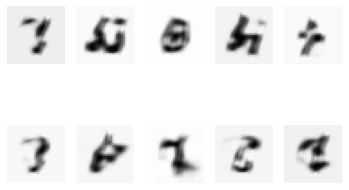

In [113]:
y = np.arange(10)
plot_specified_digit(y,cgan,32)

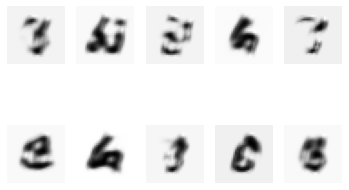

In [114]:
y = np.zeros(10)
plot_specified_digit(y,cgan,32)

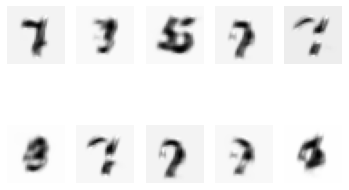

In [115]:
y = np.ones(10)
plot_specified_digit(y,cgan,32)

## Concatenate After decoding 

### 200 epochs Embedding size = 50 

Streaming output truncated to the last 5000 lines.
>10, 149/468, discriminator loss real =0.706, fake =0.628 generator loss=0.779
>10, 150/468, discriminator loss real =0.613, fake =0.653 generator loss=0.812
>10, 151/468, discriminator loss real =0.612, fake =0.671 generator loss=0.819
>10, 152/468, discriminator loss real =0.701, fake =0.666 generator loss=0.815
>10, 153/468, discriminator loss real =0.678, fake =0.660 generator loss=0.803
>10, 154/468, discriminator loss real =0.694, fake =0.721 generator loss=0.829
>10, 155/468, discriminator loss real =0.662, fake =0.665 generator loss=0.834
>10, 156/468, discriminator loss real =0.633, fake =0.660 generator loss=0.788
>10, 157/468, discriminator loss real =0.633, fake =0.631 generator loss=0.833
>10, 158/468, discriminator loss real =0.635, fake =0.705 generator loss=0.847
>10, 159/468, discriminator loss real =0.627, fake =0.662 generator loss=0.826
>10, 160/468, discriminator loss real =0.636, fake =0.662 generator loss=0.788
>

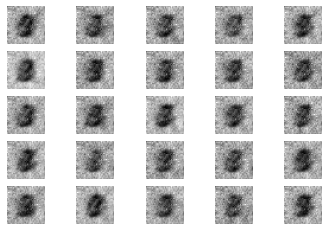

Streaming output truncated to the last 5000 lines.
>30, 149/468, discriminator loss real =0.707, fake =0.689 generator loss=0.803
>30, 150/468, discriminator loss real =0.650, fake =0.596 generator loss=0.794
>30, 151/468, discriminator loss real =0.641, fake =0.716 generator loss=0.826
>30, 152/468, discriminator loss real =0.709, fake =0.656 generator loss=0.799
>30, 153/468, discriminator loss real =0.675, fake =0.668 generator loss=0.816
>30, 154/468, discriminator loss real =0.598, fake =0.644 generator loss=0.766
>30, 155/468, discriminator loss real =0.604, fake =0.646 generator loss=0.818
>30, 156/468, discriminator loss real =0.670, fake =0.657 generator loss=0.799
>30, 157/468, discriminator loss real =0.630, fake =0.616 generator loss=0.806
>30, 158/468, discriminator loss real =0.646, fake =0.678 generator loss=0.819
>30, 159/468, discriminator loss real =0.669, fake =0.669 generator loss=0.789
>30, 160/468, discriminator loss real =0.586, fake =0.660 generator loss=0.813
>

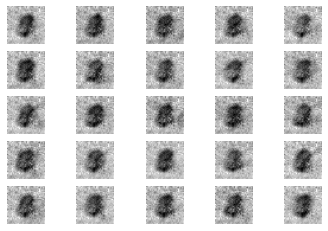

Streaming output truncated to the last 5000 lines.
>50, 149/468, discriminator loss real =0.677, fake =0.653 generator loss=0.779
>50, 150/468, discriminator loss real =0.575, fake =0.666 generator loss=0.794
>50, 151/468, discriminator loss real =0.669, fake =0.628 generator loss=0.768
>50, 152/468, discriminator loss real =0.662, fake =0.620 generator loss=0.780
>50, 153/468, discriminator loss real =0.596, fake =0.686 generator loss=0.789
>50, 154/468, discriminator loss real =0.642, fake =0.665 generator loss=0.819
>50, 155/468, discriminator loss real =0.610, fake =0.663 generator loss=0.814
>50, 156/468, discriminator loss real =0.624, fake =0.621 generator loss=0.809
>50, 157/468, discriminator loss real =0.671, fake =0.681 generator loss=0.808
>50, 158/468, discriminator loss real =0.647, fake =0.637 generator loss=0.741
>50, 159/468, discriminator loss real =0.700, fake =0.557 generator loss=0.808
>50, 160/468, discriminator loss real =0.638, fake =0.696 generator loss=0.808
>

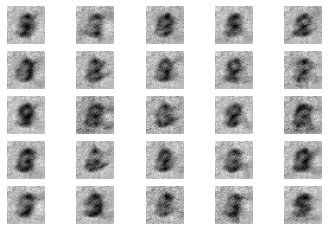

Streaming output truncated to the last 5000 lines.
>70, 149/468, discriminator loss real =0.656, fake =0.626 generator loss=0.830
>70, 150/468, discriminator loss real =0.614, fake =0.696 generator loss=0.779
>70, 151/468, discriminator loss real =0.668, fake =0.657 generator loss=0.824
>70, 152/468, discriminator loss real =0.683, fake =0.644 generator loss=0.793
>70, 153/468, discriminator loss real =0.666, fake =0.689 generator loss=0.833
>70, 154/468, discriminator loss real =0.692, fake =0.690 generator loss=0.808
>70, 155/468, discriminator loss real =0.648, fake =0.624 generator loss=0.809
>70, 156/468, discriminator loss real =0.644, fake =0.606 generator loss=0.765
>70, 157/468, discriminator loss real =0.672, fake =0.703 generator loss=0.787
>70, 158/468, discriminator loss real =0.683, fake =0.613 generator loss=0.773
>70, 159/468, discriminator loss real =0.645, fake =0.673 generator loss=0.793
>70, 160/468, discriminator loss real =0.697, fake =0.649 generator loss=0.802
>

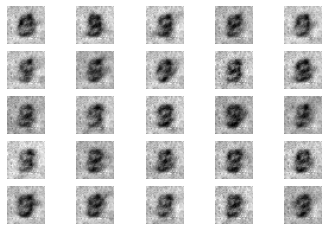

Streaming output truncated to the last 5000 lines.
>90, 149/468, discriminator loss real =0.693, fake =0.643 generator loss=0.781
>90, 150/468, discriminator loss real =0.693, fake =0.638 generator loss=0.757
>90, 151/468, discriminator loss real =0.638, fake =0.630 generator loss=0.795
>90, 152/468, discriminator loss real =0.632, fake =0.631 generator loss=0.791
>90, 153/468, discriminator loss real =0.615, fake =0.660 generator loss=0.770
>90, 154/468, discriminator loss real =0.706, fake =0.646 generator loss=0.771
>90, 155/468, discriminator loss real =0.606, fake =0.634 generator loss=0.822
>90, 156/468, discriminator loss real =0.669, fake =0.641 generator loss=0.757
>90, 157/468, discriminator loss real =0.641, fake =0.684 generator loss=0.802
>90, 158/468, discriminator loss real =0.655, fake =0.677 generator loss=0.779
>90, 159/468, discriminator loss real =0.621, fake =0.631 generator loss=0.855
>90, 160/468, discriminator loss real =0.636, fake =0.663 generator loss=0.767
>

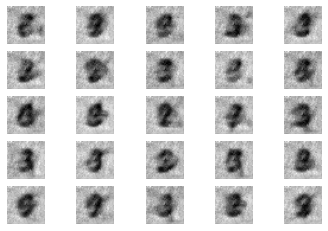

Streaming output truncated to the last 5000 lines.
>110, 149/468, discriminator loss real =0.655, fake =0.629 generator loss=0.777
>110, 150/468, discriminator loss real =0.713, fake =0.705 generator loss=0.809
>110, 151/468, discriminator loss real =0.650, fake =0.623 generator loss=0.795
>110, 152/468, discriminator loss real =0.754, fake =0.650 generator loss=0.787
>110, 153/468, discriminator loss real =0.628, fake =0.679 generator loss=0.803
>110, 154/468, discriminator loss real =0.637, fake =0.656 generator loss=0.789
>110, 155/468, discriminator loss real =0.658, fake =0.662 generator loss=0.802
>110, 156/468, discriminator loss real =0.722, fake =0.630 generator loss=0.804
>110, 157/468, discriminator loss real =0.667, fake =0.687 generator loss=0.820
>110, 158/468, discriminator loss real =0.692, fake =0.695 generator loss=0.787
>110, 159/468, discriminator loss real =0.648, fake =0.675 generator loss=0.786
>110, 160/468, discriminator loss real =0.613, fake =0.692 generator 

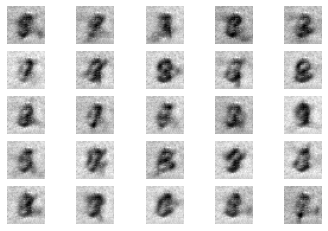

Streaming output truncated to the last 5000 lines.
>130, 149/468, discriminator loss real =0.605, fake =0.673 generator loss=0.763
>130, 150/468, discriminator loss real =0.695, fake =0.648 generator loss=0.789
>130, 151/468, discriminator loss real =0.674, fake =0.659 generator loss=0.762
>130, 152/468, discriminator loss real =0.661, fake =0.654 generator loss=0.781
>130, 153/468, discriminator loss real =0.692, fake =0.638 generator loss=0.803
>130, 154/468, discriminator loss real =0.669, fake =0.666 generator loss=0.781
>130, 155/468, discriminator loss real =0.662, fake =0.715 generator loss=0.772
>130, 156/468, discriminator loss real =0.675, fake =0.653 generator loss=0.774
>130, 157/468, discriminator loss real =0.691, fake =0.678 generator loss=0.817
>130, 158/468, discriminator loss real =0.651, fake =0.635 generator loss=0.782
>130, 159/468, discriminator loss real =0.657, fake =0.709 generator loss=0.788
>130, 160/468, discriminator loss real =0.620, fake =0.640 generator 

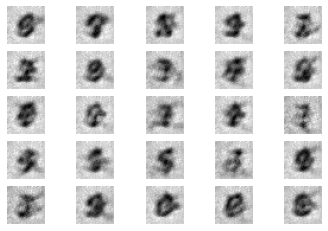

Streaming output truncated to the last 5000 lines.
>150, 149/468, discriminator loss real =0.666, fake =0.676 generator loss=0.762
>150, 150/468, discriminator loss real =0.636, fake =0.663 generator loss=0.804
>150, 151/468, discriminator loss real =0.640, fake =0.640 generator loss=0.782
>150, 152/468, discriminator loss real =0.687, fake =0.700 generator loss=0.824
>150, 153/468, discriminator loss real =0.649, fake =0.644 generator loss=0.813
>150, 154/468, discriminator loss real =0.658, fake =0.716 generator loss=0.771
>150, 155/468, discriminator loss real =0.629, fake =0.622 generator loss=0.789
>150, 156/468, discriminator loss real =0.679, fake =0.730 generator loss=0.787
>150, 157/468, discriminator loss real =0.675, fake =0.710 generator loss=0.748
>150, 158/468, discriminator loss real =0.683, fake =0.615 generator loss=0.789
>150, 159/468, discriminator loss real =0.669, fake =0.608 generator loss=0.798
>150, 160/468, discriminator loss real =0.699, fake =0.729 generator 

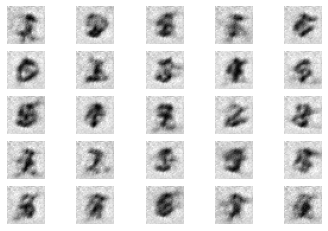

Streaming output truncated to the last 5000 lines.
>170, 149/468, discriminator loss real =0.664, fake =0.670 generator loss=0.751
>170, 150/468, discriminator loss real =0.600, fake =0.664 generator loss=0.769
>170, 151/468, discriminator loss real =0.635, fake =0.651 generator loss=0.752
>170, 152/468, discriminator loss real =0.670, fake =0.656 generator loss=0.807
>170, 153/468, discriminator loss real =0.659, fake =0.654 generator loss=0.763
>170, 154/468, discriminator loss real =0.648, fake =0.657 generator loss=0.799
>170, 155/468, discriminator loss real =0.649, fake =0.663 generator loss=0.768
>170, 156/468, discriminator loss real =0.684, fake =0.655 generator loss=0.777
>170, 157/468, discriminator loss real =0.657, fake =0.694 generator loss=0.747
>170, 158/468, discriminator loss real =0.673, fake =0.662 generator loss=0.801
>170, 159/468, discriminator loss real =0.718, fake =0.630 generator loss=0.780
>170, 160/468, discriminator loss real =0.619, fake =0.699 generator 

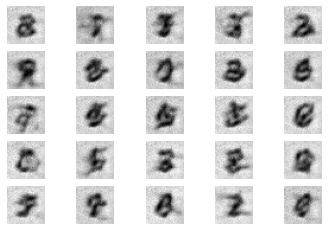

Streaming output truncated to the last 5000 lines.
>190, 149/468, discriminator loss real =0.631, fake =0.695 generator loss=0.795
>190, 150/468, discriminator loss real =0.654, fake =0.649 generator loss=0.766
>190, 151/468, discriminator loss real =0.663, fake =0.632 generator loss=0.787
>190, 152/468, discriminator loss real =0.695, fake =0.670 generator loss=0.791
>190, 153/468, discriminator loss real =0.660, fake =0.607 generator loss=0.794
>190, 154/468, discriminator loss real =0.640, fake =0.662 generator loss=0.791
>190, 155/468, discriminator loss real =0.659, fake =0.681 generator loss=0.769
>190, 156/468, discriminator loss real =0.646, fake =0.658 generator loss=0.820
>190, 157/468, discriminator loss real =0.664, fake =0.702 generator loss=0.821
>190, 158/468, discriminator loss real =0.645, fake =0.663 generator loss=0.811
>190, 159/468, discriminator loss real =0.643, fake =0.698 generator loss=0.789
>190, 160/468, discriminator loss real =0.679, fake =0.649 generator 

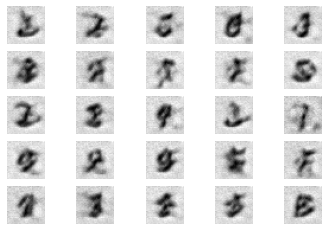

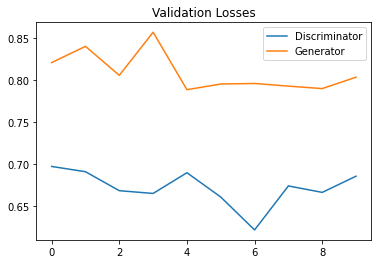

In [62]:
dataset = (x_train,y_train)
disc = define_discriminator()
gen_model = define_generator(32)
gan_model = define_gan(gen_model, disc)
train_cgan(gen_model, disc, gan_model, dataset, latent_dim = 32,n_epochs = 200 ,n_batch=128)

In [9]:
model_200 = load_model('/content/drive/MyDrive/Deep Learning /cgan_generator_200_emb.h5')

Unclear images deccoder should get the merged input of labels and features vectors

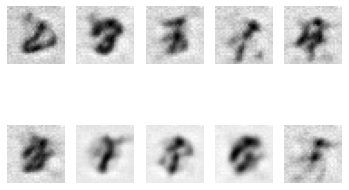

In [14]:
y = np.arange(10)
plot_specified_digit(y,model_200)

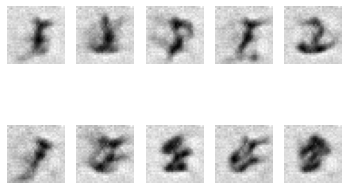

In [15]:
y = np.zeros(10)
plot_specified_digit(y,model_200)

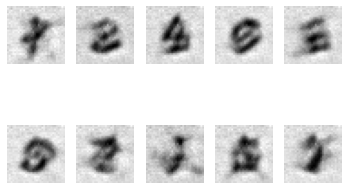

In [16]:
y = np.ones(10)
plot_specified_digit(y,model_200)

## Plot Model Architecture

### Generator

#### Conc before decoding Emb size = 20

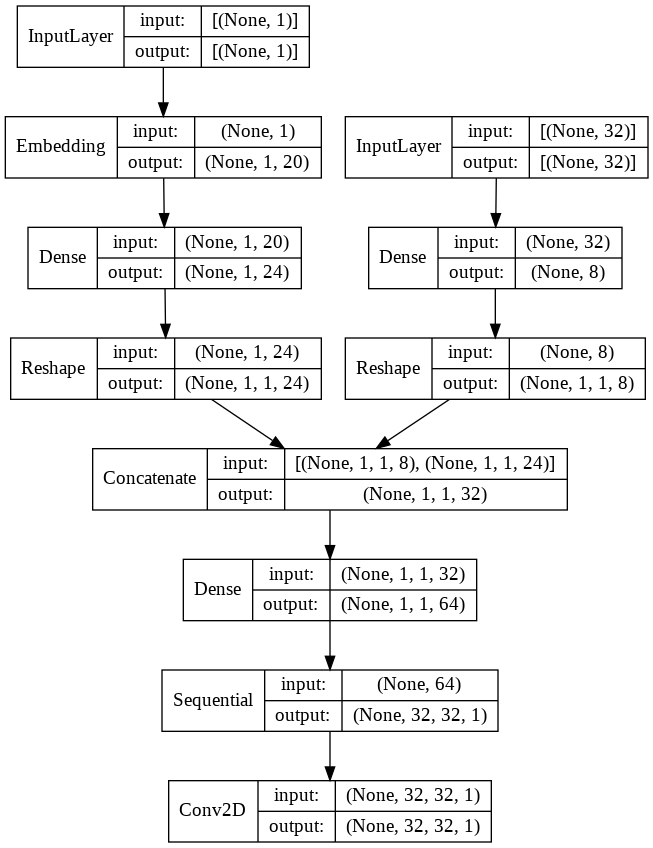

In [67]:
plot_model(gen_model, show_shapes=True,show_layer_names=False)

#### Conc after decoding Emb size = 65

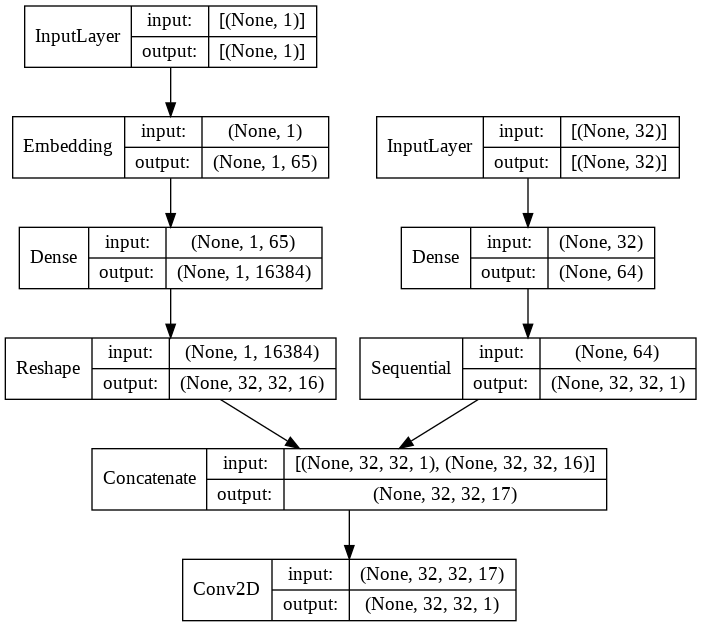

In [69]:
plot_model(gen_model, show_shapes=True,show_layer_names=False)

### Discriminator

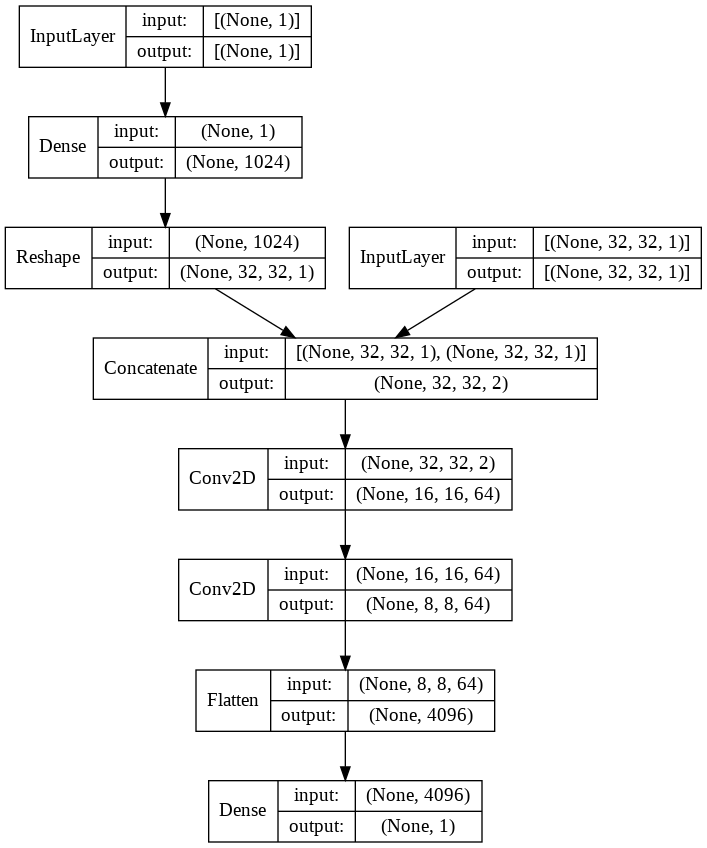

In [119]:
plot_model(disc, show_shapes=True,show_layer_names=False)

### GAN

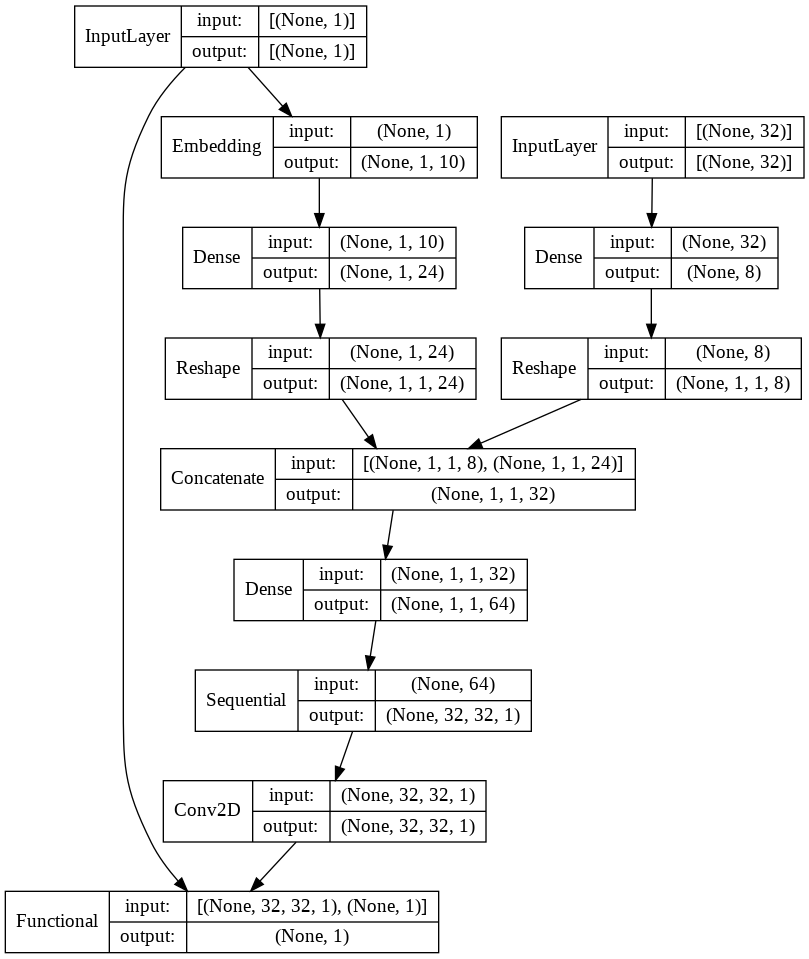

In [118]:
plot_model(gan_model, show_shapes=True,show_layer_names=False)